In [1]:
import numpy as np
import h5py
from scipy.ndimage import zoom, laplace, gaussian_filter
import matplotlib.pyplot as plt
# import matplotlib
# matplotlib.use('Agg')
import multiprocessing as mp
import os
from tqdm import tqdm
import json
import traceback
import cv2
import pickle

In [2]:
""" DATA """
INH5 = '/media/evmasuta/bigchonk/Cardiac-ECC-Net/data/cardiac-4dflow-uncorr-ecc_AXIAL.hdf5'
data = h5py.File(INH5,'r')
ALLMETA = '/media/evmasuta/bigchonk/Cardiac-ECC-Net/data/cardiac-4dflow-meta.pkl'
INTERMEDIATE_PATH = '/media/evmasuta/bigchonk/Cardiac-ECC-Net/data/cardiac-downsampled_data.hdf5'
PADS = '/media/evmasuta/bigchonk/Cardiac-ECC-Net/data/padding-record.pkl'
with open(PADS, 'rb') as f:
    pads = pickle.load(f)
# Threshold for air
THRESH = 0.05
DIMS = 64
SHRINK = 6
T=20
OUTH5vol = '/media/evmasuta/bigchonk/Cardiac-ECC-Net/cardiac_volumetric_training_{}pct_thresh.hdf5'.format(int(THRESH*100))
OUTH5coeff = '/media/evmasuta/bigchonk/Cardiac-ECC-Net/cardiac_coeff_training_{}pct_thresh.hdf5'.format(int(THRESH*100))
try:
    os.remove(OUTH5vol)
    os.remove(OUTH5coeff)
except:
    pass
outvol = h5py.File(OUTH5vol, 'w')
outcoeff = h5py.File(OUTH5coeff, 'w')
with open(ALLMETA, 'rb') as meta_file:
    allmeta = pickle.load(meta_file)

(256, 132, 256, 20, 4)


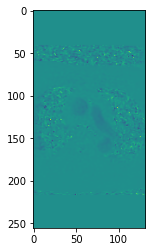

In [3]:
print(data['Ackdradum_uncorrected'].shape)
plt.figure()
plt.imshow(data['Ackdradum_ecc'][:,:,75,3,1])

In [4]:
"""
OUR PRE-PROCESSING PIPELINE WILL BE AS FOLLOWS:
0) filter our 0'd cases
1) crop image by 10% on each edge
2) linearly downsample to 64x64x64
3) Divide by VENC for vel, timeseries max for mag
4) apply normal equation to solve for cubic polyfit coefficients
5) apportion 70% training, 10% validation, 20% testing
6) save to file

"""

def crop_downsample_norm(k):
    inmtx_uncorr_ = np.array(data[k+'_uncorrected']).astype(np.float32)
    inmtx_ecc_ = np.array(data[k+'_ecc']).astype(np.float32)
    # Need to first unpad
    padmtx = pads[k]
    inmtx_uncorr = np.copy(inmtx_uncorr_[padmtx[0,0]:padmtx[0,0]+padmtx[1,0], padmtx[0,1]:padmtx[0,1]+padmtx[1,1], padmtx[0,2]:padmtx[0,2]+padmtx[1,2], :, :])
    inmtx_ecc = np.copy(inmtx_ecc_[padmtx[0,0]:padmtx[0,0]+padmtx[1,0], padmtx[0,1]:padmtx[0,1]+padmtx[1,1], padmtx[0,2]:padmtx[0,2]+padmtx[1,2], :, :])
    inmtx_uncorr_ = []
    inmtx_ecc_ = []
    # Crop 10% from each edge
    inshp = inmtx_uncorr.shape
    RDIMin = inshp[0]
    CDIMin = inshp[1]
    SDIMin = inshp[2]
    TDIMin = inshp[3]
    delta_factor = 0.1
    Rdelta = int(delta_factor * RDIMin)
    Cdelta = int(delta_factor * CDIMin)
    Sdelta = int(delta_factor * SDIMin)
    cropmtx_uncorr = np.copy(inmtx_uncorr[Rdelta:RDIMin-Rdelta, Cdelta:CDIMin-Cdelta, Sdelta:SDIMin-Sdelta, :, :])
    print(inmtx_uncorr.shape)
    print(cropmtx_uncorr.shape)
    inmtx_uncorr = []
    cropmtx_ecc = np.copy(inmtx_ecc[Rdelta:RDIMin-Rdelta, Cdelta:CDIMin-Cdelta, Sdelta:SDIMin-Sdelta, :, :])
    print(cropmtx_ecc.shape)
    inmtx_ecc = []
    DIMS = 64
    # Zoom each down to 64x64x64
    zoom_uncorr = zoom(cropmtx_uncorr, ( DIMS/(RDIMin-2*Rdelta), DIMS/(CDIMin-2*Cdelta), DIMS/(SDIMin-2*Sdelta), 1, 1), order=1)
    cropmtx_uncorr = []
    zoom_ecc = zoom(cropmtx_ecc, ( DIMS/(RDIMin-2*Rdelta), DIMS/(CDIMin-2*Cdelta), DIMS/(SDIMin-2*Sdelta), 1, 1), order=1)
    cropmtx_ecc = []
    # Remove NaNs, in any
    zoom_uncorr = np.nan_to_num(zoom_uncorr)
    zoom_ecc = np.nan_to_num(zoom_ecc)
    # Div vel by venc
    currvenc = float(allmeta[k]['venc'])
    zoom_ecc = zoom_ecc / currvenc
    # 0th index is mag
    zoom_uncorr[...,1:] = zoom_uncorr[...,1:] / currvenc
    magmax = np.amax(zoom_uncorr[...,0])
    zoom_uncorr[...,0] = zoom_uncorr[...,0] / magmax
    return (zoom_uncorr, zoom_ecc)

""" Get PIDs """
# Generate list of all pids
all_pids = []
""" WE MUST USE THE JSON KEY LIST AS IT HAS FILTERED OUT DUALVENCS """
for k in list(allmeta.keys()):
    tempkey = k#[:k.find('_')]
    if tempkey not in all_pids:
        all_pids.append(tempkey)
valid_pids = all_pids
# valid_pids = []        
# # Get valid PIDs only; MUST have 20 timepoints for consistency
# # Due to a processing error
# for k in tqdm(all_pids):
#     uncorr = data[k+'_uncorrected']
#     ecc = data[k+'_ecc']
#     sidx = ecc.shape[2] // 2
#     tidx = 3
#     try:
#         if np.amax(np.abs(uncorr[:,:,sidx,tidx,1])) > 1 and np.amax(np.abs(ecc[:,:,sidx,tidx,1])) > 1:
#             if ecc.shape[3] == T or ecc.shape[3] > T:
#                 valid_pids.append(k)
#                 print('SUCCESS AT {}'.format(k))
#             else:
#                 print('FAILURE AT {}'.format(k))
#         else:
#             print('FAILURE AT {}'.format(k))
#     except:
#         traceback.print_exc()
#         print('FAILURE AT {}'.format(k))
# print(len(all_pids), len(valid_pids))



In [6]:
""" DOWNSAMPLE.  Unfortunately, multiprocessing cannot handle decompression..."""

input_pids = valid_pids
# try:
#     os.remove(INTERMEDIATE_PATH)
# except:
#     pass
inter = h5py.File(INTERMEDIATE_PATH, 'a')
all_coeffs = dict()


for k in tqdm(input_pids):
    if not k+'_uncorr' in inter.keys():
        try:
            results = crop_downsample_norm(k)
            all_uncorr_down = results[0]
            all_ecc_down = results[1]
            all_delta = results[1] - results[0][...,1:]
            # Do not compress here to permit downstream multiprocessing
            inter.create_dataset(k+'_uncorr', data=all_uncorr_down, dtype=np.float32)
            inter.create_dataset(k+'_ecc', data=all_ecc_down, dtype=np.float32)
            inter.create_dataset(k+'_delta', data=all_delta, dtype=np.float32)
        except:
            print(k)
            traceback.print_exc()
    else:
        print('{} already in hdf5'.format(k))
inter.close()
# downsampled = h5py.File(INTERMEDIATE_PATH, 'r')

  0%|          | 0/437 [00:00<?, ?it/s]

(166, 256, 172, 20, 4)
(134, 206, 138, 20, 4)
(134, 206, 138, 20, 3)


  0%|          | 1/437 [00:28<3:23:43, 28.03s/it]

(178, 256, 168, 20, 4)
(144, 206, 136, 20, 4)
(144, 206, 136, 20, 3)


  0%|          | 2/437 [00:58<3:28:19, 28.73s/it]

(152, 256, 160, 20, 4)
(122, 206, 128, 20, 4)
(122, 206, 128, 20, 3)


  1%|          | 3/437 [01:41<3:59:10, 33.07s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


  1%|          | 4/437 [02:21<4:14:16, 35.23s/it]

(192, 256, 136, 20, 4)
(154, 206, 110, 20, 4)
(154, 206, 110, 20, 3)


  1%|          | 5/437 [03:10<4:41:46, 39.14s/it]

(192, 256, 104, 20, 4)
(154, 206, 84, 20, 4)
(154, 206, 84, 20, 3)


  1%|▏         | 6/437 [03:48<4:39:58, 38.98s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


  2%|▏         | 7/437 [04:39<5:05:24, 42.61s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


  2%|▏         | 8/437 [05:28<5:18:16, 44.51s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


  2%|▏         | 9/437 [06:17<5:26:29, 45.77s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


  2%|▏         | 10/437 [07:08<5:36:21, 47.26s/it]

(178, 256, 152, 20, 4)
(144, 206, 122, 20, 4)
(144, 206, 122, 20, 3)


  3%|▎         | 11/437 [07:56<5:38:19, 47.65s/it]

(152, 88, 256, 20, 4)
(122, 72, 206, 20, 4)
(122, 72, 206, 20, 3)


  3%|▎         | 12/437 [08:19<4:44:50, 40.21s/it]

(256, 256, 104, 20, 4)
(206, 206, 84, 20, 4)
(206, 206, 84, 20, 3)


  3%|▎         | 13/437 [09:05<4:56:29, 41.96s/it]

(178, 256, 108, 20, 4)
(144, 206, 88, 20, 4)
(144, 206, 88, 20, 3)


  3%|▎         | 14/437 [09:43<4:46:50, 40.69s/it]

(192, 120, 256, 20, 4)
(154, 96, 206, 20, 4)
(154, 96, 206, 20, 3)


  3%|▎         | 15/437 [10:26<4:51:38, 41.47s/it]

(166, 256, 172, 20, 4)
(134, 206, 138, 20, 4)
(134, 206, 138, 20, 3)


  4%|▎         | 16/437 [11:20<5:16:01, 45.04s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


  4%|▍         | 17/437 [12:02<5:09:27, 44.21s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


  4%|▍         | 18/437 [12:41<4:59:08, 42.84s/it]

(178, 256, 144, 20, 4)
(144, 206, 116, 20, 4)
(144, 206, 116, 20, 3)


  4%|▍         | 19/437 [13:27<5:05:01, 43.78s/it]

(178, 256, 132, 20, 4)
(144, 206, 106, 20, 4)
(144, 206, 106, 20, 3)


  5%|▍         | 20/437 [14:10<5:01:57, 43.45s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


  5%|▍         | 21/437 [14:59<5:13:21, 45.20s/it]

(152, 256, 172, 20, 4)
(122, 206, 138, 20, 4)
(122, 206, 138, 20, 3)


  5%|▌         | 22/437 [15:48<5:19:23, 46.18s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


  5%|▌         | 23/437 [16:27<5:05:07, 44.22s/it]

(204, 256, 136, 20, 4)
(164, 206, 110, 20, 4)
(164, 206, 110, 20, 3)


  5%|▌         | 24/437 [17:15<5:10:45, 45.15s/it]

(166, 132, 256, 20, 4)
(134, 106, 206, 20, 4)
(134, 106, 206, 20, 3)


  6%|▌         | 25/437 [17:55<5:00:24, 43.75s/it]

(174, 256, 160, 20, 4)
(140, 206, 128, 20, 4)
(140, 206, 128, 20, 3)


  6%|▌         | 26/437 [18:46<5:13:07, 45.71s/it]

(178, 256, 100, 20, 4)
(144, 206, 80, 20, 4)
(144, 206, 80, 20, 3)


  6%|▌         | 27/437 [19:22<4:52:30, 42.81s/it]

(192, 128, 256, 20, 4)
(154, 104, 206, 20, 4)
(154, 104, 206, 20, 3)


  6%|▋         | 28/437 [20:08<4:59:13, 43.90s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


  7%|▋         | 29/437 [20:57<5:09:46, 45.55s/it]

(216, 256, 120, 20, 4)
(174, 206, 96, 20, 4)
(174, 206, 96, 20, 3)


  7%|▋         | 30/437 [21:42<5:06:02, 45.12s/it]

(204, 256, 112, 20, 4)
(164, 206, 90, 20, 4)
(164, 206, 90, 20, 3)


  7%|▋         | 31/437 [22:25<5:01:23, 44.54s/it]

(192, 256, 180, 20, 4)
(154, 206, 144, 20, 4)
(154, 206, 144, 20, 3)


  7%|▋         | 32/437 [23:19<5:19:32, 47.34s/it]

(204, 256, 132, 20, 4)
(164, 206, 106, 20, 4)
(164, 206, 106, 20, 3)


  8%|▊         | 33/437 [24:00<5:06:52, 45.57s/it]

(192, 256, 136, 20, 4)
(154, 206, 110, 20, 4)
(154, 206, 110, 20, 3)


  8%|▊         | 34/437 [24:48<5:10:49, 46.28s/it]

(216, 256, 120, 20, 4)
(174, 206, 96, 20, 4)
(174, 206, 96, 20, 3)


  8%|▊         | 35/437 [25:31<5:03:29, 45.30s/it]

(178, 256, 148, 20, 4)
(144, 206, 120, 20, 4)
(144, 206, 120, 20, 3)


  8%|▊         | 36/437 [26:18<5:05:34, 45.72s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


  8%|▊         | 37/437 [26:57<4:52:31, 43.88s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


  9%|▊         | 38/437 [27:37<4:43:16, 42.60s/it]

(192, 256, 184, 20, 4)
(154, 206, 148, 20, 4)
(154, 206, 148, 20, 3)


  9%|▉         | 39/437 [28:38<5:19:38, 48.19s/it]

(192, 256, 144, 20, 4)
(154, 206, 116, 20, 4)
(154, 206, 116, 20, 3)


  9%|▉         | 40/437 [29:25<5:15:26, 47.68s/it]

(192, 256, 152, 20, 4)
(154, 206, 122, 20, 4)
(154, 206, 122, 20, 3)


  9%|▉         | 41/437 [30:12<5:13:28, 47.50s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 10%|▉         | 42/437 [30:54<5:01:53, 45.86s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 10%|▉         | 43/437 [31:32<4:46:40, 43.66s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 10%|█         | 44/437 [32:23<4:59:51, 45.78s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 10%|█         | 45/437 [33:02<4:45:56, 43.77s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 11%|█         | 46/437 [33:54<5:00:31, 46.12s/it]

(204, 256, 160, 20, 4)
(164, 206, 128, 20, 4)
(164, 206, 128, 20, 3)


 11%|█         | 47/437 [34:44<5:07:35, 47.32s/it]

(152, 92, 256, 20, 4)
(122, 74, 206, 20, 4)
(122, 74, 206, 20, 3)


 11%|█         | 48/437 [35:15<4:35:03, 42.43s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 11%|█         | 49/437 [36:04<4:47:44, 44.49s/it]

(192, 256, 96, 20, 4)
(154, 206, 78, 20, 4)
(154, 206, 78, 20, 3)


 11%|█▏        | 50/437 [36:42<4:33:16, 42.37s/it]

(192, 108, 256, 20, 4)
(154, 88, 206, 20, 4)
(154, 88, 206, 20, 3)


 12%|█▏        | 51/437 [37:17<4:20:00, 40.42s/it]

(166, 256, 172, 20, 4)
(134, 206, 138, 20, 4)
(134, 206, 138, 20, 3)


 12%|█▏        | 52/437 [38:08<4:38:17, 43.37s/it]

(166, 256, 168, 20, 4)
(134, 206, 136, 20, 4)
(134, 206, 136, 20, 3)


 12%|█▏        | 53/437 [38:56<4:47:14, 44.88s/it]

(166, 104, 256, 20, 4)
(134, 84, 206, 20, 4)
(134, 84, 206, 20, 3)


 12%|█▏        | 54/437 [39:33<4:31:02, 42.46s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 13%|█▎        | 55/437 [40:11<4:22:22, 41.21s/it]

(152, 256, 176, 20, 4)
(122, 206, 142, 20, 4)
(122, 206, 142, 20, 3)


 13%|█▎        | 56/437 [41:05<4:46:03, 45.05s/it]

(178, 256, 168, 20, 4)
(144, 206, 136, 20, 4)
(144, 206, 136, 20, 3)


 13%|█▎        | 57/437 [41:56<4:56:40, 46.84s/it]

(192, 256, 128, 20, 4)
(154, 206, 104, 20, 4)
(154, 206, 104, 20, 3)


 13%|█▎        | 58/437 [42:43<4:55:24, 46.77s/it]

(192, 256, 128, 20, 4)
(154, 206, 104, 20, 4)
(154, 206, 104, 20, 3)


 14%|█▎        | 59/437 [43:30<4:55:48, 46.95s/it]

(166, 104, 256, 20, 4)
(134, 84, 206, 20, 4)
(134, 84, 206, 20, 3)


 14%|█▎        | 60/437 [44:07<4:36:12, 43.96s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 14%|█▍        | 61/437 [44:59<4:51:03, 46.45s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 14%|█▍        | 62/437 [45:42<4:42:41, 45.23s/it]

(152, 256, 180, 20, 4)
(122, 206, 144, 20, 4)
(122, 206, 144, 20, 3)


 14%|█▍        | 63/437 [46:34<4:54:36, 47.26s/it]

(178, 256, 124, 20, 4)
(144, 206, 100, 20, 4)
(144, 206, 100, 20, 3)


 15%|█▍        | 64/437 [47:14<4:40:51, 45.18s/it]

(192, 256, 140, 20, 4)
(154, 206, 112, 20, 4)
(154, 206, 112, 20, 3)


 15%|█▍        | 65/437 [47:59<4:39:28, 45.08s/it]

(408, 512, 120, 20, 4)
(328, 410, 96, 20, 4)
(328, 410, 96, 20, 3)


 15%|█▌        | 66/437 [50:23<7:43:14, 74.92s/it]

(152, 256, 136, 20, 4)
(122, 206, 110, 20, 4)
(122, 206, 110, 20, 3)


 15%|█▌        | 67/437 [51:06<6:42:38, 65.29s/it]

(178, 112, 256, 20, 4)
(144, 90, 206, 20, 4)
(144, 90, 206, 20, 3)


 16%|█▌        | 68/437 [51:47<5:56:17, 57.93s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 16%|█▌        | 69/437 [52:26<5:20:30, 52.26s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 16%|█▌        | 70/437 [53:06<4:57:52, 48.70s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 16%|█▌        | 71/437 [53:48<4:43:52, 46.54s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 16%|█▋        | 72/437 [54:37<4:47:34, 47.27s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 17%|█▋        | 73/437 [55:20<4:39:56, 46.14s/it]

(152, 256, 172, 20, 4)
(122, 206, 138, 20, 4)
(122, 206, 138, 20, 3)


 17%|█▋        | 74/437 [56:07<4:40:09, 46.31s/it]

(216, 256, 172, 20, 4)
(174, 206, 138, 20, 4)
(174, 206, 138, 20, 3)


 17%|█▋        | 75/437 [57:00<4:51:03, 48.24s/it]

(192, 256, 140, 20, 4)
(154, 206, 112, 20, 4)
(154, 206, 112, 20, 3)


 17%|█▋        | 76/437 [57:43<4:41:16, 46.75s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 18%|█▊        | 77/437 [58:33<4:45:56, 47.66s/it]

(166, 256, 164, 20, 4)
(134, 206, 132, 20, 4)
(134, 206, 132, 20, 3)


 18%|█▊        | 78/437 [59:21<4:45:13, 47.67s/it]

(178, 256, 184, 20, 4)
(144, 206, 148, 20, 4)
(144, 206, 148, 20, 3)


 18%|█▊        | 79/437 [1:00:17<5:00:30, 50.36s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 18%|█▊        | 80/437 [1:01:00<4:46:02, 48.07s/it]

(204, 256, 108, 20, 4)
(164, 206, 88, 20, 4)
(164, 206, 88, 20, 3)


 19%|█▊        | 81/437 [1:01:40<4:30:04, 45.52s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 19%|█▉        | 82/437 [1:02:20<4:20:45, 44.07s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 19%|█▉        | 83/437 [1:03:04<4:18:36, 43.83s/it]

(178, 256, 88, 20, 4)
(144, 206, 72, 20, 4)
(144, 206, 72, 20, 3)


 19%|█▉        | 84/437 [1:03:28<3:43:27, 37.98s/it]

(216, 256, 120, 20, 4)
(174, 206, 96, 20, 4)
(174, 206, 96, 20, 3)


 19%|█▉        | 85/437 [1:04:12<3:53:16, 39.76s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 20%|█▉        | 86/437 [1:05:01<4:08:35, 42.49s/it]

(166, 256, 172, 20, 4)
(134, 206, 138, 20, 4)
(134, 206, 138, 20, 3)


 20%|█▉        | 87/437 [1:05:50<4:20:11, 44.60s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 20%|██        | 88/437 [1:06:34<4:18:11, 44.39s/it]

(152, 256, 184, 20, 4)
(122, 206, 148, 20, 4)
(122, 206, 148, 20, 3)


 20%|██        | 89/437 [1:07:28<4:33:08, 47.09s/it]

(178, 256, 128, 20, 4)
(144, 206, 104, 20, 4)
(144, 206, 104, 20, 3)


 21%|██        | 90/437 [1:08:14<4:30:51, 46.83s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 21%|██        | 91/437 [1:09:04<4:36:09, 47.89s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 21%|██        | 92/437 [1:09:46<4:24:59, 46.09s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 21%|██▏       | 93/437 [1:10:24<4:11:10, 43.81s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 22%|██▏       | 94/437 [1:11:06<4:06:40, 43.15s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 22%|██▏       | 95/437 [1:11:44<3:56:30, 41.49s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 22%|██▏       | 96/437 [1:12:27<3:58:56, 42.04s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 22%|██▏       | 97/437 [1:13:10<4:00:33, 42.45s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 22%|██▏       | 98/437 [1:13:49<3:52:46, 41.20s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 23%|██▎       | 99/437 [1:14:31<3:53:55, 41.52s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 23%|██▎       | 100/437 [1:15:14<3:56:04, 42.03s/it]

(192, 256, 140, 20, 4)
(154, 206, 112, 20, 4)
(154, 206, 112, 20, 3)


 23%|██▎       | 101/437 [1:15:58<3:57:36, 42.43s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 23%|██▎       | 102/437 [1:16:49<4:12:01, 45.14s/it]

(204, 256, 160, 20, 4)
(164, 206, 128, 20, 4)
(164, 206, 128, 20, 3)


 24%|██▎       | 103/437 [1:17:37<4:16:17, 46.04s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 24%|██▍       | 104/437 [1:18:28<4:23:44, 47.52s/it]

(192, 256, 136, 20, 4)
(154, 206, 110, 20, 4)
(154, 206, 110, 20, 3)


 24%|██▍       | 105/437 [1:19:17<4:24:55, 47.88s/it]

(168, 256, 180, 20, 4)
(136, 206, 144, 20, 4)
(136, 206, 144, 20, 3)


 24%|██▍       | 106/437 [1:20:09<4:31:47, 49.27s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 24%|██▍       | 107/437 [1:20:53<4:21:53, 47.62s/it]

(192, 124, 256, 20, 4)
(154, 100, 206, 20, 4)
(154, 100, 206, 20, 3)


 25%|██▍       | 108/437 [1:21:34<4:10:23, 45.66s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 25%|██▍       | 109/437 [1:22:24<4:16:15, 46.88s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 25%|██▌       | 110/437 [1:23:06<4:08:02, 45.51s/it]

(194, 256, 96, 20, 4)
(156, 206, 78, 20, 4)
(156, 206, 78, 20, 3)


 25%|██▌       | 111/437 [1:23:45<3:55:52, 43.41s/it]

(192, 256, 164, 20, 4)
(154, 206, 132, 20, 4)
(154, 206, 132, 20, 3)


 26%|██▌       | 112/437 [1:24:35<4:06:46, 45.56s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 26%|██▌       | 113/437 [1:25:16<3:57:24, 43.97s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 26%|██▌       | 114/437 [1:25:59<3:55:29, 43.74s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 26%|██▋       | 115/437 [1:26:40<3:51:13, 43.09s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 27%|██▋       | 116/437 [1:27:33<4:05:34, 45.90s/it]

(188, 256, 128, 20, 4)
(152, 206, 104, 20, 4)
(152, 206, 104, 20, 3)


 27%|██▋       | 117/437 [1:28:17<4:02:42, 45.51s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 27%|██▋       | 118/437 [1:29:08<4:10:30, 47.12s/it]

(192, 256, 136, 20, 4)
(154, 206, 110, 20, 4)
(154, 206, 110, 20, 3)


 27%|██▋       | 119/437 [1:29:57<4:11:26, 47.44s/it]

(192, 256, 132, 20, 4)
(154, 206, 106, 20, 4)
(154, 206, 106, 20, 3)


 27%|██▋       | 120/437 [1:30:39<4:02:36, 45.92s/it]

(178, 256, 128, 20, 4)
(144, 206, 104, 20, 4)
(144, 206, 104, 20, 3)


 28%|██▊       | 121/437 [1:31:22<3:57:22, 45.07s/it]

(192, 108, 256, 20, 4)
(154, 88, 206, 20, 4)
(154, 88, 206, 20, 3)


 28%|██▊       | 122/437 [1:32:02<3:48:19, 43.49s/it]

(178, 256, 116, 20, 4)
(144, 206, 94, 20, 4)
(144, 206, 94, 20, 3)


 28%|██▊       | 123/437 [1:32:39<3:37:31, 41.57s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 28%|██▊       | 124/437 [1:33:19<3:34:50, 41.18s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 29%|██▊       | 125/437 [1:34:10<3:49:06, 44.06s/it]

(256, 124, 256, 20, 4)
(206, 100, 206, 20, 4)
(206, 100, 206, 20, 3)


 29%|██▉       | 126/437 [1:34:57<3:52:29, 44.86s/it]

(204, 256, 180, 20, 4)
(164, 206, 144, 20, 4)
(164, 206, 144, 20, 3)


 29%|██▉       | 127/437 [1:35:51<4:06:31, 47.72s/it]

(178, 256, 164, 20, 4)
(144, 206, 132, 20, 4)
(144, 206, 132, 20, 3)


 29%|██▉       | 128/437 [1:36:38<4:05:03, 47.58s/it]

(204, 256, 172, 20, 4)
(164, 206, 138, 20, 4)
(164, 206, 138, 20, 3)


 30%|██▉       | 129/437 [1:37:31<4:12:53, 49.27s/it]

(178, 256, 112, 20, 4)
(144, 206, 90, 20, 4)
(144, 206, 90, 20, 3)


 30%|██▉       | 130/437 [1:38:12<3:58:10, 46.55s/it]

(192, 256, 100, 20, 4)
(154, 206, 80, 20, 4)
(154, 206, 80, 20, 3)


 30%|██▉       | 131/437 [1:38:46<3:39:20, 43.01s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 30%|███       | 132/437 [1:39:36<3:48:16, 44.91s/it]

(166, 256, 128, 20, 4)
(134, 206, 104, 20, 4)
(134, 206, 104, 20, 3)


 30%|███       | 133/437 [1:40:18<3:43:44, 44.16s/it]

(166, 256, 172, 20, 4)
(134, 206, 138, 20, 4)
(134, 206, 138, 20, 3)


 31%|███       | 134/437 [1:41:09<3:52:34, 46.05s/it]

(178, 256, 136, 20, 4)
(144, 206, 110, 20, 4)
(144, 206, 110, 20, 3)


 31%|███       | 135/437 [1:41:56<3:53:43, 46.44s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 31%|███       | 136/437 [1:42:45<3:57:17, 47.30s/it]

(192, 256, 128, 20, 4)
(154, 206, 104, 20, 4)
(154, 206, 104, 20, 3)


 31%|███▏      | 137/437 [1:43:33<3:57:39, 47.53s/it]

(166, 256, 112, 20, 4)
(134, 206, 90, 20, 4)
(134, 206, 90, 20, 3)


 32%|███▏      | 138/437 [1:44:10<3:39:54, 44.13s/it]

(188, 256, 128, 20, 4)
(152, 206, 104, 20, 4)
(152, 206, 104, 20, 3)


 32%|███▏      | 139/437 [1:44:58<3:45:11, 45.34s/it]

(216, 256, 104, 20, 4)
(174, 206, 84, 20, 4)
(174, 206, 84, 20, 3)


 32%|███▏      | 140/437 [1:45:39<3:39:04, 44.26s/it]

(358, 512, 120, 20, 4)
(288, 410, 96, 20, 4)
(288, 410, 96, 20, 3)


 32%|███▏      | 141/437 [1:48:00<6:00:36, 73.10s/it]

(152, 140, 256, 20, 4)
(122, 112, 206, 20, 4)
(122, 112, 206, 20, 3)


 32%|███▏      | 142/437 [1:48:39<5:09:25, 62.93s/it]

(192, 256, 132, 20, 4)
(154, 206, 106, 20, 4)
(154, 206, 106, 20, 3)


 33%|███▎      | 143/437 [1:49:21<4:37:21, 56.61s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 33%|███▎      | 144/437 [1:50:01<4:12:45, 51.76s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 33%|███▎      | 145/437 [1:50:51<4:08:03, 50.97s/it]

(178, 256, 128, 20, 4)
(144, 206, 104, 20, 4)
(144, 206, 104, 20, 3)


 33%|███▎      | 146/437 [1:51:36<3:59:12, 49.32s/it]

(204, 256, 132, 20, 4)
(164, 206, 106, 20, 4)
(164, 206, 106, 20, 3)


 34%|███▎      | 147/437 [1:52:17<3:46:14, 46.81s/it]

(192, 256, 168, 20, 4)
(154, 206, 136, 20, 4)
(154, 206, 136, 20, 3)


 34%|███▍      | 148/437 [1:53:08<3:52:13, 48.21s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 34%|███▍      | 149/437 [1:53:59<3:54:10, 48.79s/it]

(166, 256, 132, 20, 4)
(134, 206, 106, 20, 4)
(134, 206, 106, 20, 3)


 34%|███▍      | 150/437 [1:54:37<3:37:54, 45.56s/it]

(178, 256, 152, 20, 4)
(144, 206, 122, 20, 4)
(144, 206, 122, 20, 3)


 35%|███▍      | 151/437 [1:55:25<3:40:39, 46.29s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 35%|███▍      | 152/437 [1:56:04<3:29:47, 44.17s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 35%|███▌      | 153/437 [1:56:46<3:26:59, 43.73s/it]

(152, 124, 256, 20, 4)
(122, 100, 206, 20, 4)
(122, 100, 206, 20, 3)


 35%|███▌      | 154/437 [1:57:22<3:14:20, 41.20s/it]

(408, 120, 512, 20, 4)
(328, 96, 410, 20, 4)
(328, 96, 410, 20, 3)


 35%|███▌      | 155/437 [1:59:43<5:34:29, 71.17s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 36%|███▌      | 156/437 [2:00:32<5:01:55, 64.47s/it]

(152, 256, 136, 20, 4)
(122, 206, 110, 20, 4)
(122, 206, 110, 20, 3)


 36%|███▌      | 157/437 [2:01:14<4:30:21, 57.94s/it]

(152, 256, 148, 20, 4)
(122, 206, 120, 20, 4)
(122, 206, 120, 20, 3)


 36%|███▌      | 158/437 [2:01:53<4:03:02, 52.27s/it]

(204, 256, 360, 20, 4)
(164, 206, 288, 20, 4)
(164, 206, 288, 20, 3)


 36%|███▋      | 159/437 [2:03:29<5:02:16, 65.24s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 37%|███▋      | 160/437 [2:04:12<4:29:45, 58.43s/it]

(178, 256, 124, 20, 4)
(144, 206, 100, 20, 4)
(144, 206, 100, 20, 3)


 37%|███▋      | 161/437 [2:04:51<4:02:17, 52.67s/it]

(152, 256, 176, 20, 4)
(122, 206, 142, 20, 4)
(122, 206, 142, 20, 3)


 37%|███▋      | 162/437 [2:05:40<3:56:20, 51.56s/it]

(152, 140, 256, 20, 4)
(122, 112, 206, 20, 4)
(122, 112, 206, 20, 3)


 37%|███▋      | 163/437 [2:06:19<3:38:07, 47.77s/it]

(204, 256, 160, 20, 4)
(164, 206, 128, 20, 4)
(164, 206, 128, 20, 3)


 38%|███▊      | 164/437 [2:07:05<3:35:54, 47.45s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 38%|███▊      | 165/437 [2:07:53<3:35:00, 47.43s/it]

(216, 256, 120, 20, 4)
(174, 206, 96, 20, 4)
(174, 206, 96, 20, 3)


 38%|███▊      | 166/437 [2:08:36<3:29:03, 46.28s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 38%|███▊      | 167/437 [2:09:17<3:20:54, 44.64s/it]

(204, 256, 132, 20, 4)
(164, 206, 106, 20, 4)
(164, 206, 106, 20, 3)


 38%|███▊      | 168/437 [2:10:01<3:19:12, 44.43s/it]

(166, 256, 172, 20, 4)
(134, 206, 138, 20, 4)
(134, 206, 138, 20, 3)


 39%|███▊      | 169/437 [2:10:52<3:27:10, 46.38s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 39%|███▉      | 170/437 [2:11:42<3:31:50, 47.60s/it]

(178, 124, 256, 20, 4)
(144, 100, 206, 20, 4)
(144, 100, 206, 20, 3)


 39%|███▉      | 171/437 [2:12:22<3:19:39, 45.04s/it]

(166, 256, 168, 20, 4)
(134, 206, 136, 20, 4)
(134, 206, 136, 20, 3)


 39%|███▉      | 172/437 [2:13:13<3:26:49, 46.83s/it]

(166, 256, 172, 20, 4)
(134, 206, 138, 20, 4)
(134, 206, 138, 20, 3)


 40%|███▉      | 173/437 [2:14:02<3:29:34, 47.63s/it]

(216, 256, 120, 20, 4)
(174, 206, 96, 20, 4)
(174, 206, 96, 20, 3)


 40%|███▉      | 174/437 [2:14:44<3:21:24, 45.95s/it]

(178, 136, 256, 20, 4)
(144, 110, 206, 20, 4)
(144, 110, 206, 20, 3)


 40%|████      | 175/437 [2:15:27<3:16:55, 45.10s/it]

(192, 256, 136, 20, 4)
(154, 206, 110, 20, 4)
(154, 206, 110, 20, 3)


 40%|████      | 176/437 [2:16:16<3:21:12, 46.25s/it]

(166, 256, 124, 20, 4)
(134, 206, 100, 20, 4)
(134, 206, 100, 20, 3)


 41%|████      | 177/437 [2:16:54<3:10:06, 43.87s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 41%|████      | 178/437 [2:17:30<2:59:08, 41.50s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 41%|████      | 179/437 [2:18:13<2:59:46, 41.81s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 41%|████      | 180/437 [2:18:56<3:00:57, 42.25s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 41%|████▏     | 181/437 [2:19:35<2:56:27, 41.36s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 42%|████▏     | 182/437 [2:20:15<2:53:28, 40.82s/it]

(192, 120, 256, 20, 4)
(154, 96, 206, 20, 4)
(154, 96, 206, 20, 3)


 42%|████▏     | 183/437 [2:20:59<2:56:56, 41.80s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 42%|████▏     | 184/437 [2:21:43<2:58:21, 42.30s/it]

(204, 256, 152, 20, 4)
(164, 206, 122, 20, 4)
(164, 206, 122, 20, 3)


 42%|████▏     | 185/437 [2:22:35<3:10:23, 45.33s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 43%|████▎     | 186/437 [2:23:23<3:12:44, 46.07s/it]

(152, 256, 176, 20, 4)
(122, 206, 142, 20, 4)
(122, 206, 142, 20, 3)


 43%|████▎     | 187/437 [2:24:16<3:21:08, 48.27s/it]

(166, 256, 152, 20, 4)
(134, 206, 122, 20, 4)
(134, 206, 122, 20, 3)


 43%|████▎     | 188/437 [2:25:01<3:16:33, 47.36s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 43%|████▎     | 189/437 [2:25:54<3:22:04, 48.89s/it]

(408, 512, 108, 20, 4)
(328, 410, 88, 20, 4)
(328, 410, 88, 20, 3)


 43%|████▎     | 190/437 [2:27:56<4:51:37, 70.84s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 44%|████▎     | 191/437 [2:28:39<4:16:43, 62.62s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 44%|████▍     | 192/437 [2:29:18<3:46:28, 55.46s/it]

(204, 256, 128, 20, 4)
(164, 206, 104, 20, 4)
(164, 206, 104, 20, 3)


 44%|████▍     | 193/437 [2:30:02<3:31:34, 52.03s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 44%|████▍     | 194/437 [2:30:44<3:17:58, 48.88s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 45%|████▍     | 195/437 [2:31:27<3:10:54, 47.33s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 45%|████▍     | 196/437 [2:32:17<3:12:43, 47.98s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 45%|████▌     | 197/437 [2:33:06<3:13:37, 48.40s/it]

(178, 256, 152, 20, 4)
(144, 206, 122, 20, 4)
(144, 206, 122, 20, 3)


 45%|████▌     | 198/437 [2:33:53<3:11:09, 47.99s/it]

(152, 256, 164, 20, 4)
(122, 206, 132, 20, 4)
(122, 206, 132, 20, 3)


 46%|████▌     | 199/437 [2:34:40<3:08:45, 47.59s/it]

(166, 256, 152, 20, 4)
(134, 206, 122, 20, 4)
(134, 206, 122, 20, 3)


 46%|████▌     | 200/437 [2:35:25<3:04:38, 46.75s/it]

(256, 256, 180, 20, 4)
(206, 206, 144, 20, 4)
(206, 206, 144, 20, 3)


 46%|████▌     | 201/437 [2:36:26<3:21:17, 51.17s/it]

(192, 128, 256, 20, 4)
(154, 104, 206, 20, 4)
(154, 104, 206, 20, 3)


 46%|████▌     | 202/437 [2:37:12<3:14:36, 49.69s/it]

(460, 512, 140, 20, 4)
(368, 410, 112, 20, 4)
(368, 410, 112, 20, 3)


 46%|████▋     | 203/437 [2:40:08<5:40:51, 87.40s/it]

(178, 256, 152, 20, 4)
(144, 206, 122, 20, 4)
(144, 206, 122, 20, 3)


 47%|████▋     | 204/437 [2:40:55<4:53:03, 75.47s/it]

(140, 108, 256, 20, 4)
(112, 88, 206, 20, 4)
(112, 88, 206, 20, 3)


 47%|████▋     | 205/437 [2:41:27<4:01:21, 62.42s/it]

(152, 256, 120, 20, 4)
(122, 206, 96, 20, 4)
(122, 206, 96, 20, 3)


 47%|████▋     | 206/437 [2:42:05<3:31:35, 54.96s/it]

(178, 256, 112, 20, 4)
(144, 206, 90, 20, 4)
(144, 206, 90, 20, 3)


 47%|████▋     | 207/437 [2:42:42<3:09:43, 49.49s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 48%|████▊     | 208/437 [2:43:28<3:04:37, 48.37s/it]

(460, 512, 140, 20, 4)
(368, 410, 112, 20, 4)
(368, 410, 112, 20, 3)


 48%|████▊     | 209/437 [2:46:19<5:24:20, 85.35s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 48%|████▊     | 210/437 [2:46:57<4:29:28, 71.23s/it]

(152, 140, 256, 20, 4)
(122, 112, 206, 20, 4)
(122, 112, 206, 20, 3)


 48%|████▊     | 211/437 [2:47:36<3:51:46, 61.53s/it]

(178, 256, 148, 20, 4)
(144, 206, 120, 20, 4)
(144, 206, 120, 20, 3)


 49%|████▊     | 212/437 [2:48:20<3:30:20, 56.09s/it]

(152, 256, 184, 20, 4)
(122, 206, 148, 20, 4)
(122, 206, 148, 20, 3)


 49%|████▊     | 213/437 [2:49:11<3:23:30, 54.51s/it]

(152, 116, 256, 20, 4)
(122, 94, 206, 20, 4)
(122, 94, 206, 20, 3)


 49%|████▉     | 214/437 [2:49:45<3:00:43, 48.63s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 49%|████▉     | 215/437 [2:50:22<2:46:47, 45.08s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 49%|████▉     | 216/437 [2:51:11<2:50:24, 46.27s/it]

(178, 256, 168, 20, 4)
(144, 206, 136, 20, 4)
(144, 206, 136, 20, 3)


 50%|████▉     | 217/437 [2:52:01<2:53:07, 47.22s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 50%|████▉     | 218/437 [2:52:42<2:45:27, 45.33s/it]

(152, 256, 192, 20, 4)
(122, 206, 154, 20, 4)
(122, 206, 154, 20, 3)


 50%|█████     | 219/437 [2:53:46<3:05:33, 51.07s/it]

(166, 256, 180, 20, 4)
(134, 206, 144, 20, 4)
(134, 206, 144, 20, 3)


 50%|█████     | 220/437 [2:54:35<3:02:44, 50.53s/it]

(204, 256, 136, 20, 4)
(164, 206, 110, 20, 4)
(164, 206, 110, 20, 3)


 51%|█████     | 221/437 [2:55:21<2:56:46, 49.10s/it]

(230, 256, 120, 20, 4)
(184, 206, 96, 20, 4)
(184, 206, 96, 20, 3)


 51%|█████     | 222/437 [2:56:04<2:49:41, 47.36s/it]

(192, 256, 152, 20, 4)
(154, 206, 122, 20, 4)
(154, 206, 122, 20, 3)


 51%|█████     | 223/437 [2:56:52<2:49:34, 47.55s/it]

(166, 256, 152, 20, 4)
(134, 206, 122, 20, 4)
(134, 206, 122, 20, 3)


 51%|█████▏    | 224/437 [2:57:37<2:46:00, 46.76s/it]

(198, 256, 148, 20, 4)
(160, 206, 120, 20, 4)
(160, 206, 120, 20, 3)


 51%|█████▏    | 225/437 [2:58:22<2:42:33, 46.01s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 52%|█████▏    | 226/437 [2:58:57<2:30:55, 42.92s/it]

(178, 256, 164, 20, 4)
(144, 206, 132, 20, 4)
(144, 206, 132, 20, 3)


 52%|█████▏    | 227/437 [2:59:47<2:37:10, 44.91s/it]

(166, 128, 256, 20, 4)
(134, 104, 206, 20, 4)
(134, 104, 206, 20, 3)


 52%|█████▏    | 228/437 [3:00:30<2:34:59, 44.50s/it]

(192, 256, 144, 20, 4)
(154, 206, 116, 20, 4)
(154, 206, 116, 20, 3)


 52%|█████▏    | 229/437 [3:01:17<2:36:50, 45.24s/it]

(166, 256, 128, 20, 4)
(134, 206, 104, 20, 4)
(134, 206, 104, 20, 3)


 53%|█████▎    | 230/437 [3:02:01<2:34:15, 44.71s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 53%|█████▎    | 231/437 [3:02:51<2:39:33, 46.47s/it]

(192, 256, 136, 20, 4)
(154, 206, 110, 20, 4)
(154, 206, 110, 20, 3)


 53%|█████▎    | 232/437 [3:03:40<2:41:02, 47.13s/it]

(204, 256, 100, 20, 4)
(164, 206, 80, 20, 4)
(164, 206, 80, 20, 3)


 53%|█████▎    | 233/437 [3:04:15<2:28:11, 43.59s/it]

(178, 256, 164, 20, 4)
(144, 206, 132, 20, 4)
(144, 206, 132, 20, 3)


 54%|█████▎    | 234/437 [3:05:06<2:34:51, 45.77s/it]

(178, 256, 84, 20, 4)
(144, 206, 68, 20, 4)
(144, 206, 68, 20, 3)


 54%|█████▍    | 235/437 [3:05:29<2:11:12, 38.97s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 54%|█████▍    | 236/437 [3:06:17<2:19:20, 41.59s/it]

(192, 256, 140, 20, 4)
(154, 206, 112, 20, 4)
(154, 206, 112, 20, 3)


 54%|█████▍    | 237/437 [3:07:01<2:20:50, 42.25s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 54%|█████▍    | 238/437 [3:07:38<2:14:41, 40.61s/it]

(166, 256, 168, 20, 4)
(134, 206, 136, 20, 4)
(134, 206, 136, 20, 3)


 55%|█████▍    | 239/437 [3:08:29<2:24:14, 43.71s/it]

(192, 256, 128, 20, 4)
(154, 206, 104, 20, 4)
(154, 206, 104, 20, 3)


 55%|█████▍    | 240/437 [3:09:17<2:27:44, 45.00s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 55%|█████▌    | 241/437 [3:10:07<2:31:50, 46.48s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 55%|█████▌    | 242/437 [3:10:56<2:33:46, 47.32s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 56%|█████▌    | 243/437 [3:11:37<2:26:34, 45.33s/it]

(178, 256, 152, 20, 4)
(144, 206, 122, 20, 4)
(144, 206, 122, 20, 3)


 56%|█████▌    | 244/437 [3:12:26<2:29:30, 46.48s/it]

(178, 120, 256, 20, 4)
(144, 96, 206, 20, 4)
(144, 96, 206, 20, 3)


 56%|█████▌    | 245/437 [3:13:04<2:20:57, 44.05s/it]

(140, 256, 176, 20, 4)
(112, 206, 142, 20, 4)
(112, 206, 142, 20, 3)


 56%|█████▋    | 246/437 [3:13:52<2:23:26, 45.06s/it]

(256, 172, 256, 20, 4)
(206, 138, 206, 20, 4)
(206, 138, 206, 20, 3)


 57%|█████▋    | 247/437 [3:14:49<2:34:49, 48.89s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 57%|█████▋    | 248/437 [3:15:36<2:32:08, 48.30s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 57%|█████▋    | 249/437 [3:16:18<2:25:29, 46.43s/it]

(178, 256, 136, 20, 4)
(144, 206, 110, 20, 4)
(144, 206, 110, 20, 3)


 57%|█████▋    | 250/437 [3:17:07<2:27:14, 47.25s/it]

(178, 256, 144, 20, 4)
(144, 206, 116, 20, 4)
(144, 206, 116, 20, 3)


 57%|█████▋    | 251/437 [3:17:53<2:25:00, 46.78s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 58%|█████▊    | 252/437 [3:18:30<2:15:27, 43.93s/it]

(166, 256, 176, 20, 4)
(134, 206, 142, 20, 4)
(134, 206, 142, 20, 3)


 58%|█████▊    | 253/437 [3:19:28<2:27:19, 48.04s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 58%|█████▊    | 254/437 [3:20:10<2:21:15, 46.32s/it]

(160, 256, 168, 20, 4)
(128, 206, 136, 20, 4)
(128, 206, 136, 20, 3)


 58%|█████▊    | 255/437 [3:20:59<2:22:22, 46.94s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 59%|█████▊    | 256/437 [3:21:49<2:24:37, 47.94s/it]

(192, 256, 144, 20, 4)
(154, 206, 116, 20, 4)
(154, 206, 116, 20, 3)


 59%|█████▉    | 257/437 [3:22:36<2:22:40, 47.56s/it]

(178, 256, 128, 20, 4)
(144, 206, 104, 20, 4)
(144, 206, 104, 20, 3)


 59%|█████▉    | 258/437 [3:23:22<2:20:21, 47.05s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 59%|█████▉    | 259/437 [3:24:13<2:23:53, 48.51s/it]

(204, 256, 128, 20, 4)
(164, 206, 104, 20, 4)
(164, 206, 104, 20, 3)


 59%|█████▉    | 260/437 [3:25:02<2:22:50, 48.42s/it]

(204, 256, 104, 20, 4)
(164, 206, 84, 20, 4)
(164, 206, 84, 20, 3)


 60%|█████▉    | 261/437 [3:25:38<2:11:22, 44.79s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 60%|█████▉    | 262/437 [3:26:30<2:17:06, 47.01s/it]

(192, 256, 92, 20, 4)
(154, 206, 74, 20, 4)
(154, 206, 74, 20, 3)


 60%|██████    | 263/437 [3:27:02<2:03:04, 42.44s/it]

(192, 256, 124, 20, 4)
(154, 206, 100, 20, 4)
(154, 206, 100, 20, 3)


 60%|██████    | 264/437 [3:27:41<1:59:36, 41.49s/it]

(166, 256, 152, 20, 4)
(134, 206, 122, 20, 4)
(134, 206, 122, 20, 3)


 61%|██████    | 265/437 [3:28:27<2:02:50, 42.85s/it]

(166, 256, 180, 20, 4)
(134, 206, 144, 20, 4)
(134, 206, 144, 20, 3)


 61%|██████    | 266/437 [3:29:23<2:12:52, 46.62s/it]

(192, 256, 128, 20, 4)
(154, 206, 104, 20, 4)
(154, 206, 104, 20, 3)


 61%|██████    | 267/437 [3:30:10<2:12:33, 46.78s/it]

(166, 124, 256, 20, 4)
(134, 100, 206, 20, 4)
(134, 100, 206, 20, 3)


 61%|██████▏   | 268/437 [3:30:48<2:04:11, 44.09s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 62%|██████▏   | 269/437 [3:31:36<2:06:55, 45.33s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 62%|██████▏   | 270/437 [3:32:27<2:10:53, 47.03s/it]

(166, 256, 140, 20, 4)
(134, 206, 112, 20, 4)
(134, 206, 112, 20, 3)


 62%|██████▏   | 271/437 [3:33:06<2:03:49, 44.76s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 62%|██████▏   | 272/437 [3:33:48<2:00:29, 43.81s/it]

(192, 256, 140, 20, 4)
(154, 206, 112, 20, 4)
(154, 206, 112, 20, 3)


 62%|██████▏   | 273/437 [3:34:32<1:59:44, 43.81s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 63%|██████▎   | 274/437 [3:35:21<2:03:09, 45.34s/it]

(192, 256, 144, 20, 4)
(154, 206, 116, 20, 4)
(154, 206, 116, 20, 3)


 63%|██████▎   | 275/437 [3:36:07<2:03:34, 45.77s/it]

(192, 256, 148, 20, 4)
(154, 206, 120, 20, 4)
(154, 206, 120, 20, 3)


 63%|██████▎   | 276/437 [3:36:54<2:03:48, 46.14s/it]

(188, 256, 88, 20, 4)
(152, 206, 72, 20, 4)
(152, 206, 72, 20, 3)


 63%|██████▎   | 277/437 [3:37:18<1:45:19, 39.49s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 64%|██████▎   | 278/437 [3:38:10<1:54:06, 43.06s/it]

(178, 128, 256, 20, 4)
(144, 104, 206, 20, 4)
(144, 104, 206, 20, 3)


 64%|██████▍   | 279/437 [3:38:54<1:54:21, 43.43s/it]

(152, 256, 180, 20, 4)
(122, 206, 144, 20, 4)
(122, 206, 144, 20, 3)


 64%|██████▍   | 280/437 [3:39:44<1:58:28, 45.28s/it]

(166, 256, 120, 20, 4)
(134, 206, 96, 20, 4)
(134, 206, 96, 20, 3)


 64%|██████▍   | 281/437 [3:40:21<1:51:25, 42.86s/it]

(192, 116, 256, 20, 4)
(154, 94, 206, 20, 4)
(154, 94, 206, 20, 3)


 65%|██████▍   | 282/437 [3:40:58<1:46:29, 41.23s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 65%|██████▍   | 283/437 [3:41:41<1:47:17, 41.80s/it]

(166, 256, 140, 20, 4)
(134, 206, 112, 20, 4)
(134, 206, 112, 20, 3)


 65%|██████▍   | 284/437 [3:42:22<1:45:51, 41.51s/it]

(358, 140, 512, 20, 4)
(288, 112, 410, 20, 4)
(288, 112, 410, 20, 3)


 65%|██████▌   | 285/437 [3:45:04<3:16:42, 77.65s/it]

(152, 256, 176, 20, 4)
(122, 206, 142, 20, 4)
(122, 206, 142, 20, 3)


 65%|██████▌   | 286/437 [3:45:57<2:56:32, 70.15s/it]

(204, 256, 160, 20, 4)
(164, 206, 128, 20, 4)
(164, 206, 128, 20, 3)


 66%|██████▌   | 287/437 [3:46:46<2:39:29, 63.80s/it]

(178, 256, 172, 20, 4)
(144, 206, 138, 20, 4)
(144, 206, 138, 20, 3)


 66%|██████▌   | 288/437 [3:47:37<2:28:45, 59.91s/it]

(166, 256, 136, 20, 4)
(134, 206, 110, 20, 4)
(134, 206, 110, 20, 3)


 66%|██████▌   | 289/437 [3:48:21<2:16:30, 55.34s/it]

(188, 256, 128, 20, 4)
(152, 206, 104, 20, 4)
(152, 206, 104, 20, 3)


 66%|██████▋   | 290/437 [3:49:08<2:09:03, 52.68s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 67%|██████▋   | 291/437 [3:49:50<2:00:37, 49.57s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 67%|██████▋   | 292/437 [3:50:37<1:58:03, 48.85s/it]

(192, 256, 140, 20, 4)
(154, 206, 112, 20, 4)
(154, 206, 112, 20, 3)


 67%|██████▋   | 293/437 [3:51:22<1:54:00, 47.51s/it]

(152, 256, 160, 20, 4)
(122, 206, 128, 20, 4)
(122, 206, 128, 20, 3)


 67%|██████▋   | 294/437 [3:52:07<1:51:30, 46.78s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 68%|██████▊   | 295/437 [3:52:55<1:51:58, 47.31s/it]

(166, 256, 132, 20, 4)
(134, 206, 106, 20, 4)
(134, 206, 106, 20, 3)


 68%|██████▊   | 296/437 [3:53:36<1:46:11, 45.19s/it]

(204, 256, 108, 20, 4)
(164, 206, 88, 20, 4)
(164, 206, 88, 20, 3)


 68%|██████▊   | 297/437 [3:54:13<1:40:15, 42.97s/it]

(166, 256, 128, 20, 4)
(134, 206, 104, 20, 4)
(134, 206, 104, 20, 3)


 68%|██████▊   | 298/437 [3:54:58<1:40:53, 43.55s/it]

(216, 256, 136, 20, 4)
(174, 206, 110, 20, 4)
(174, 206, 110, 20, 3)


 68%|██████▊   | 299/437 [3:55:50<1:45:31, 45.88s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 69%|██████▊   | 300/437 [3:56:27<1:38:50, 43.29s/it]

(166, 256, 164, 20, 4)
(134, 206, 132, 20, 4)
(134, 206, 132, 20, 3)


 69%|██████▉   | 301/437 [3:57:15<1:41:13, 44.65s/it]

(216, 256, 112, 20, 4)
(174, 206, 90, 20, 4)
(174, 206, 90, 20, 3)


 69%|██████▉   | 302/437 [3:57:57<1:38:43, 43.87s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 69%|██████▉   | 303/437 [3:58:39<1:37:04, 43.46s/it]

(204, 256, 100, 20, 4)
(164, 206, 80, 20, 4)
(164, 206, 80, 20, 3)


 70%|██████▉   | 304/437 [3:59:15<1:30:59, 41.05s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 70%|██████▉   | 305/437 [3:59:52<1:27:35, 39.81s/it]

(178, 132, 256, 20, 4)
(144, 106, 206, 20, 4)
(144, 106, 206, 20, 3)


 70%|███████   | 306/437 [4:00:33<1:27:47, 40.21s/it]

(194, 256, 140, 20, 4)
(156, 206, 112, 20, 4)
(156, 206, 112, 20, 3)


 70%|███████   | 307/437 [4:01:19<1:30:46, 41.90s/it]

(152, 140, 256, 20, 4)
(122, 112, 206, 20, 4)
(122, 112, 206, 20, 3)


 70%|███████   | 308/437 [4:01:57<1:27:33, 40.73s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 71%|███████   | 309/437 [4:02:40<1:28:34, 41.52s/it]

(204, 256, 108, 20, 4)
(164, 206, 88, 20, 4)
(164, 206, 88, 20, 3)


 71%|███████   | 310/437 [4:03:17<1:25:17, 40.30s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 71%|███████   | 311/437 [4:04:10<1:32:21, 43.98s/it]

(204, 256, 172, 20, 4)
(164, 206, 138, 20, 4)
(164, 206, 138, 20, 3)


 71%|███████▏  | 312/437 [4:05:03<1:37:21, 46.74s/it]

(216, 256, 120, 20, 4)
(174, 206, 96, 20, 4)
(174, 206, 96, 20, 3)


 72%|███████▏  | 313/437 [4:05:45<1:33:45, 45.37s/it]

(358, 108, 512, 20, 4)
(288, 88, 410, 20, 4)
(288, 88, 410, 20, 3)


 72%|███████▏  | 314/437 [4:07:43<2:17:47, 67.21s/it]

(178, 256, 176, 20, 4)
(144, 206, 142, 20, 4)
(144, 206, 142, 20, 3)


 72%|███████▏  | 315/437 [4:08:36<2:07:36, 62.76s/it]

(172, 256, 140, 20, 4)
(138, 206, 112, 20, 4)
(138, 206, 112, 20, 3)


 72%|███████▏  | 316/437 [4:09:09<1:48:45, 53.93s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 73%|███████▎  | 317/437 [4:09:51<1:40:23, 50.20s/it]

(184, 256, 120, 20, 4)
(148, 206, 96, 20, 4)
(148, 206, 96, 20, 3)


 73%|███████▎  | 318/437 [4:10:32<1:34:25, 47.61s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 73%|███████▎  | 319/437 [4:11:07<1:26:19, 43.89s/it]

(178, 256, 148, 20, 4)
(144, 206, 120, 20, 4)
(144, 206, 120, 20, 3)


 73%|███████▎  | 320/437 [4:11:51<1:25:13, 43.70s/it]

(192, 136, 256, 20, 4)
(154, 110, 206, 20, 4)
(154, 110, 206, 20, 3)


 73%|███████▎  | 321/437 [4:12:34<1:24:28, 43.69s/it]

(178, 256, 180, 20, 4)
(144, 206, 144, 20, 4)
(144, 206, 144, 20, 3)


 74%|███████▎  | 322/437 [4:13:27<1:28:39, 46.26s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 74%|███████▍  | 323/437 [4:14:17<1:29:58, 47.35s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 74%|███████▍  | 324/437 [4:15:07<1:31:11, 48.42s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 74%|███████▍  | 325/437 [4:15:49<1:26:37, 46.41s/it]

(178, 100, 256, 20, 4)
(144, 80, 206, 20, 4)
(144, 80, 206, 20, 3)


 75%|███████▍  | 326/437 [4:16:25<1:20:10, 43.34s/it]

(192, 256, 144, 20, 4)
(154, 206, 116, 20, 4)
(154, 206, 116, 20, 3)


 75%|███████▍  | 327/437 [4:17:13<1:21:56, 44.70s/it]

(204, 256, 136, 20, 4)
(164, 206, 110, 20, 4)
(164, 206, 110, 20, 3)


 75%|███████▌  | 328/437 [4:18:02<1:23:38, 46.04s/it]

(152, 256, 160, 20, 4)
(122, 206, 128, 20, 4)
(122, 206, 128, 20, 3)


 75%|███████▌  | 329/437 [4:18:48<1:22:27, 45.81s/it]

(358, 512, 140, 20, 4)
(288, 410, 112, 20, 4)
(288, 410, 112, 20, 3)


 76%|███████▌  | 330/437 [4:21:30<2:23:54, 80.69s/it]

(166, 124, 256, 20, 4)
(134, 100, 206, 20, 4)
(134, 100, 206, 20, 3)


 76%|███████▌  | 331/437 [4:22:08<1:59:52, 67.85s/it]

(166, 256, 180, 20, 4)
(134, 206, 144, 20, 4)
(134, 206, 144, 20, 3)


 76%|███████▌  | 332/437 [4:22:59<1:50:02, 62.88s/it]

(166, 256, 188, 20, 4)
(134, 206, 152, 20, 4)
(134, 206, 152, 20, 3)


 76%|███████▌  | 333/437 [4:23:58<1:46:54, 61.67s/it]

(178, 120, 256, 20, 4)
(144, 96, 206, 20, 4)
(144, 96, 206, 20, 3)


 76%|███████▋  | 334/437 [4:24:35<1:33:26, 54.43s/it]

(166, 140, 256, 20, 4)
(134, 112, 206, 20, 4)
(134, 112, 206, 20, 3)


 77%|███████▋  | 335/437 [4:25:16<1:25:41, 50.40s/it]

(192, 256, 108, 20, 4)
(154, 206, 88, 20, 4)
(154, 206, 88, 20, 3)


 77%|███████▋  | 336/437 [4:25:54<1:18:26, 46.60s/it]

(178, 256, 172, 20, 4)
(144, 206, 138, 20, 4)
(144, 206, 138, 20, 3)


 77%|███████▋  | 337/437 [4:26:45<1:19:51, 47.91s/it]

(178, 140, 256, 20, 4)
(144, 112, 206, 20, 4)
(144, 112, 206, 20, 3)


 77%|███████▋  | 338/437 [4:27:27<1:16:12, 46.19s/it]

(216, 256, 152, 20, 4)
(174, 206, 122, 20, 4)
(174, 206, 122, 20, 3)


 78%|███████▊  | 339/437 [4:28:16<1:16:45, 46.99s/it]

(192, 120, 256, 20, 4)
(154, 96, 206, 20, 4)
(154, 96, 206, 20, 3)


 78%|███████▊  | 340/437 [4:28:58<1:13:25, 45.41s/it]

(178, 140, 256, 20, 4)
(144, 112, 206, 20, 4)
(144, 112, 206, 20, 3)


 78%|███████▊  | 341/437 [4:29:38<1:10:12, 43.88s/it]

(178, 256, 96, 20, 4)
(144, 206, 78, 20, 4)
(144, 206, 78, 20, 3)


 78%|███████▊  | 342/437 [4:30:13<1:05:09, 41.15s/it]

(178, 256, 140, 20, 4)
(144, 206, 112, 20, 4)
(144, 206, 112, 20, 3)


 78%|███████▊  | 343/437 [4:30:57<1:05:54, 42.07s/it]

(152, 256, 160, 20, 4)
(122, 206, 128, 20, 4)
(122, 206, 128, 20, 3)


 79%|███████▊  | 344/437 [4:31:45<1:08:00, 43.88s/it]

(166, 152, 256, 20, 4)
(134, 122, 206, 20, 4)
(134, 122, 206, 20, 3)


 79%|███████▉  | 345/437 [4:32:30<1:07:44, 44.17s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 79%|███████▉  | 346/437 [4:33:20<1:09:40, 45.94s/it]

(166, 256, 164, 20, 4)
(134, 206, 132, 20, 4)
(134, 206, 132, 20, 3)


 79%|███████▉  | 347/437 [4:34:09<1:10:01, 46.68s/it]

(178, 116, 256, 20, 4)
(144, 94, 206, 20, 4)
(144, 94, 206, 20, 3)


 80%|███████▉  | 348/437 [4:34:47<1:05:47, 44.36s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 80%|███████▉  | 349/437 [4:35:40<1:08:31, 46.73s/it]

(204, 256, 136, 20, 4)
(164, 206, 110, 20, 4)
(164, 206, 110, 20, 3)


 80%|████████  | 350/437 [4:36:28<1:08:17, 47.10s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 80%|████████  | 351/437 [4:37:16<1:08:04, 47.49s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 81%|████████  | 352/437 [4:38:08<1:09:08, 48.81s/it]

(166, 136, 256, 20, 4)
(134, 110, 206, 20, 4)
(134, 110, 206, 20, 3)


 81%|████████  | 353/437 [4:38:47<1:04:24, 46.00s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 81%|████████  | 354/437 [4:39:36<1:04:46, 46.83s/it]

(166, 132, 256, 20, 4)
(134, 106, 206, 20, 4)
(134, 106, 206, 20, 3)


 81%|████████  | 355/437 [4:40:15<1:00:38, 44.37s/it]

(192, 132, 256, 20, 4)
(154, 106, 206, 20, 4)
(154, 106, 206, 20, 3)


 81%|████████▏ | 356/437 [4:40:55<58:22, 43.24s/it]  

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 82%|████████▏ | 357/437 [4:41:46<1:00:43, 45.54s/it]

(140, 256, 180, 20, 4)
(112, 206, 144, 20, 4)
(112, 206, 144, 20, 3)


 82%|████████▏ | 358/437 [4:42:35<1:01:03, 46.37s/it]

(178, 256, 168, 20, 4)
(144, 206, 136, 20, 4)
(144, 206, 136, 20, 3)


 82%|████████▏ | 359/437 [4:43:25<1:01:48, 47.54s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 82%|████████▏ | 360/437 [4:44:07<59:00, 45.98s/it]  

(256, 256, 128, 20, 4)
(206, 206, 104, 20, 4)
(206, 206, 104, 20, 3)


 83%|████████▎ | 361/437 [4:44:59<1:00:30, 47.77s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 83%|████████▎ | 362/437 [4:45:51<1:01:07, 48.90s/it]

(178, 256, 132, 20, 4)
(144, 206, 106, 20, 4)
(144, 206, 106, 20, 3)


 83%|████████▎ | 363/437 [4:46:31<57:04, 46.27s/it]  

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 83%|████████▎ | 364/437 [4:47:23<58:20, 47.95s/it]

(178, 256, 140, 20, 4)
(144, 206, 112, 20, 4)
(144, 206, 112, 20, 3)


 84%|████████▎ | 365/437 [4:48:05<55:25, 46.19s/it]

(178, 256, 172, 20, 4)
(144, 206, 138, 20, 4)
(144, 206, 138, 20, 3)


 84%|████████▍ | 366/437 [4:48:54<55:50, 47.19s/it]

(166, 256, 180, 20, 4)
(134, 206, 144, 20, 4)
(134, 206, 144, 20, 3)


 84%|████████▍ | 367/437 [4:49:44<55:57, 47.97s/it]

(178, 256, 140, 20, 4)
(144, 206, 112, 20, 4)
(144, 206, 112, 20, 3)


 84%|████████▍ | 368/437 [4:50:25<52:39, 45.79s/it]

(216, 256, 120, 20, 4)
(174, 206, 96, 20, 4)
(174, 206, 96, 20, 3)


 84%|████████▍ | 369/437 [4:51:08<51:08, 45.13s/it]

(152, 144, 256, 20, 4)
(122, 116, 206, 20, 4)
(122, 116, 206, 20, 3)


 85%|████████▍ | 370/437 [4:51:51<49:25, 44.27s/it]

(214, 256, 88, 20, 4)
(172, 206, 72, 20, 4)
(172, 206, 72, 20, 3)


 85%|████████▍ | 371/437 [4:52:16<42:21, 38.51s/it]

(166, 256, 180, 20, 4)
(134, 206, 144, 20, 4)
(134, 206, 144, 20, 3)


 85%|████████▌ | 372/437 [4:53:11<47:12, 43.57s/it]

(204, 256, 136, 20, 4)
(164, 206, 110, 20, 4)
(164, 206, 110, 20, 3)


 85%|████████▌ | 373/437 [4:53:57<47:18, 44.34s/it]

(192, 256, 144, 20, 4)
(154, 206, 116, 20, 4)
(154, 206, 116, 20, 3)


 86%|████████▌ | 374/437 [4:54:45<47:39, 45.39s/it]

(192, 256, 136, 20, 4)
(154, 206, 110, 20, 4)
(154, 206, 110, 20, 3)


 86%|████████▌ | 375/437 [4:55:31<47:07, 45.61s/it]

(216, 256, 120, 20, 4)
(174, 206, 96, 20, 4)
(174, 206, 96, 20, 3)


 86%|████████▌ | 376/437 [4:56:13<45:03, 44.32s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 86%|████████▋ | 377/437 [4:56:53<43:17, 43.29s/it]

(192, 256, 128, 20, 4)
(154, 206, 104, 20, 4)
(154, 206, 104, 20, 3)


 86%|████████▋ | 378/437 [4:57:42<44:08, 44.89s/it]

(178, 128, 256, 20, 4)
(144, 104, 206, 20, 4)
(144, 104, 206, 20, 3)


 87%|████████▋ | 379/437 [4:58:29<43:51, 45.38s/it]

(178, 256, 168, 20, 4)
(144, 206, 136, 20, 4)
(144, 206, 136, 20, 3)


 87%|████████▋ | 380/437 [4:59:20<44:56, 47.31s/it]

(152, 256, 148, 20, 4)
(122, 206, 120, 20, 4)
(122, 206, 120, 20, 3)


 87%|████████▋ | 381/437 [5:00:04<43:01, 46.09s/it]

(166, 100, 256, 20, 4)
(134, 80, 206, 20, 4)
(134, 80, 206, 20, 3)


 87%|████████▋ | 382/437 [5:00:36<38:35, 42.11s/it]

(152, 256, 120, 20, 4)
(122, 206, 96, 20, 4)
(122, 206, 96, 20, 3)


 88%|████████▊ | 383/437 [5:01:15<36:51, 40.96s/it]

(192, 256, 148, 20, 4)
(154, 206, 120, 20, 4)
(154, 206, 120, 20, 3)


 88%|████████▊ | 384/437 [5:02:01<37:35, 42.56s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 88%|████████▊ | 385/437 [5:02:45<37:09, 42.87s/it]

(192, 256, 104, 20, 4)
(154, 206, 84, 20, 4)
(154, 206, 84, 20, 3)


 88%|████████▊ | 386/437 [5:03:22<34:58, 41.14s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 89%|████████▊ | 387/437 [5:04:03<34:25, 41.31s/it]

(160, 256, 160, 20, 4)
(128, 206, 128, 20, 4)
(128, 206, 128, 20, 3)


 89%|████████▉ | 388/437 [5:04:52<35:29, 43.45s/it]

(162, 256, 136, 20, 4)
(130, 206, 110, 20, 4)
(130, 206, 110, 20, 3)


 89%|████████▉ | 389/437 [5:05:35<34:47, 43.48s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 89%|████████▉ | 390/437 [5:06:16<33:18, 42.53s/it]

(162, 256, 128, 20, 4)
(130, 206, 104, 20, 4)
(130, 206, 104, 20, 3)


 89%|████████▉ | 391/437 [5:06:59<32:47, 42.77s/it]

(166, 256, 152, 20, 4)
(134, 206, 122, 20, 4)
(134, 206, 122, 20, 3)


 90%|████████▉ | 392/437 [5:07:46<33:01, 44.03s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 90%|████████▉ | 393/437 [5:08:37<33:51, 46.18s/it]

(178, 108, 256, 20, 4)
(144, 88, 206, 20, 4)
(144, 88, 206, 20, 3)


 90%|█████████ | 394/437 [5:09:13<30:50, 43.02s/it]

(358, 512, 172, 20, 4)
(288, 410, 138, 20, 4)
(288, 410, 138, 20, 3)


 90%|█████████ | 395/437 [5:12:19<1:00:06, 85.88s/it]

(166, 256, 148, 20, 4)
(134, 206, 120, 20, 4)
(134, 206, 120, 20, 3)


 91%|█████████ | 396/437 [5:13:02<49:55, 73.07s/it]  

(192, 256, 132, 20, 4)
(154, 206, 106, 20, 4)
(154, 206, 106, 20, 3)


 91%|█████████ | 397/437 [5:13:43<42:13, 63.34s/it]

(178, 256, 136, 20, 4)
(144, 206, 110, 20, 4)
(144, 206, 110, 20, 3)


 91%|█████████ | 398/437 [5:14:29<37:50, 58.22s/it]

(178, 116, 256, 20, 4)
(144, 94, 206, 20, 4)
(144, 94, 206, 20, 3)


 91%|█████████▏| 399/437 [5:15:07<33:02, 52.16s/it]

(178, 256, 180, 20, 4)
(144, 206, 144, 20, 4)
(144, 206, 144, 20, 3)


 92%|█████████▏| 400/437 [5:16:01<32:34, 52.83s/it]

(192, 256, 160, 20, 4)
(154, 206, 128, 20, 4)
(154, 206, 128, 20, 3)


 92%|█████████▏| 401/437 [5:16:51<31:04, 51.79s/it]

(166, 256, 136, 20, 4)
(134, 206, 110, 20, 4)
(134, 206, 110, 20, 3)


 92%|█████████▏| 402/437 [5:17:32<28:28, 48.80s/it]

(178, 256, 148, 20, 4)
(144, 206, 120, 20, 4)
(144, 206, 120, 20, 3)


 92%|█████████▏| 403/437 [5:18:15<26:31, 46.80s/it]

(166, 256, 160, 20, 4)
(134, 206, 128, 20, 4)
(134, 206, 128, 20, 3)


 92%|█████████▏| 404/437 [5:19:01<25:38, 46.62s/it]

(178, 76, 256, 20, 4)
(144, 62, 206, 20, 4)
(144, 62, 206, 20, 3)


 93%|█████████▎| 405/437 [5:19:23<20:55, 39.23s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 93%|█████████▎| 406/437 [5:20:03<20:22, 39.45s/it]

(178, 256, 108, 20, 4)
(144, 206, 88, 20, 4)
(144, 206, 88, 20, 3)


 93%|█████████▎| 407/437 [5:20:39<19:13, 38.45s/it]

(332, 512, 176, 20, 4)
(266, 410, 142, 20, 4)
(266, 410, 142, 20, 3)


 93%|█████████▎| 408/437 [5:23:49<40:32, 83.88s/it]

(192, 256, 140, 20, 4)
(154, 206, 112, 20, 4)
(154, 206, 112, 20, 3)


 94%|█████████▎| 409/437 [5:24:33<33:36, 72.03s/it]

(192, 124, 256, 20, 4)
(154, 100, 206, 20, 4)
(154, 100, 206, 20, 3)


 94%|█████████▍| 410/437 [5:25:14<28:10, 62.60s/it]

(152, 256, 164, 20, 4)
(122, 206, 132, 20, 4)
(122, 206, 132, 20, 3)


 94%|█████████▍| 411/437 [5:26:01<25:04, 57.87s/it]

(178, 256, 144, 20, 4)
(144, 206, 116, 20, 4)
(144, 206, 116, 20, 3)


 94%|█████████▍| 412/437 [5:26:47<22:38, 54.34s/it]

(166, 256, 140, 20, 4)
(134, 206, 112, 20, 4)
(134, 206, 112, 20, 3)


 95%|█████████▍| 413/437 [5:27:27<20:02, 50.12s/it]

(178, 256, 160, 20, 4)
(144, 206, 128, 20, 4)
(144, 206, 128, 20, 3)


 95%|█████████▍| 414/437 [5:28:15<19:00, 49.58s/it]

(192, 256, 140, 20, 4)
(154, 206, 112, 20, 4)
(154, 206, 112, 20, 3)


 95%|█████████▍| 415/437 [5:28:58<17:27, 47.59s/it]

(152, 256, 168, 20, 4)
(122, 206, 136, 20, 4)
(122, 206, 136, 20, 3)


 95%|█████████▌| 416/437 [5:29:43<16:23, 46.83s/it]

(192, 256, 168, 20, 4)
(154, 206, 136, 20, 4)
(154, 206, 136, 20, 3)


 95%|█████████▌| 417/437 [5:30:34<15:57, 47.90s/it]

(178, 256, 148, 20, 4)
(144, 206, 120, 20, 4)
(144, 206, 120, 20, 3)


 96%|█████████▌| 418/437 [5:31:16<14:40, 46.34s/it]

(192, 256, 168, 20, 4)
(154, 206, 136, 20, 4)
(154, 206, 136, 20, 3)


 96%|█████████▌| 419/437 [5:32:05<14:08, 47.13s/it]

(192, 124, 256, 20, 4)
(154, 100, 206, 20, 4)
(154, 100, 206, 20, 3)


 96%|█████████▌| 420/437 [5:32:46<12:47, 45.17s/it]

(204, 256, 160, 20, 4)
(164, 206, 128, 20, 4)
(164, 206, 128, 20, 3)


 96%|█████████▋| 421/437 [5:33:36<12:26, 46.66s/it]

(152, 256, 180, 20, 4)
(122, 206, 144, 20, 4)
(122, 206, 144, 20, 3)


 97%|█████████▋| 422/437 [5:34:25<11:48, 47.22s/it]

(178, 256, 148, 20, 4)
(144, 206, 120, 20, 4)
(144, 206, 120, 20, 3)


 97%|█████████▋| 423/437 [5:35:10<10:52, 46.58s/it]

(192, 256, 120, 20, 4)
(154, 206, 96, 20, 4)
(154, 206, 96, 20, 3)


 97%|█████████▋| 424/437 [5:35:53<09:53, 45.62s/it]

(178, 256, 120, 20, 4)
(144, 206, 96, 20, 4)
(144, 206, 96, 20, 3)


 97%|█████████▋| 425/437 [5:36:33<08:47, 43.92s/it]

(192, 256, 140, 20, 4)
(154, 206, 112, 20, 4)
(154, 206, 112, 20, 3)


 97%|█████████▋| 426/437 [5:37:18<08:07, 44.35s/it]

(166, 256, 148, 20, 4)
(134, 206, 120, 20, 4)
(134, 206, 120, 20, 3)


 98%|█████████▊| 427/437 [5:38:02<07:22, 44.26s/it]

(152, 256, 172, 20, 4)
(122, 206, 138, 20, 4)
(122, 206, 138, 20, 3)


 98%|█████████▊| 428/437 [5:38:49<06:45, 45.01s/it]

(192, 256, 128, 20, 4)
(154, 206, 104, 20, 4)
(154, 206, 104, 20, 3)


 98%|█████████▊| 429/437 [5:39:36<06:04, 45.62s/it]

(142, 256, 160, 20, 4)
(114, 206, 128, 20, 4)
(114, 206, 128, 20, 3)


 98%|█████████▊| 430/437 [5:40:00<04:34, 39.22s/it]

(166, 256, 168, 20, 4)
(134, 206, 136, 20, 4)
(134, 206, 136, 20, 3)


 99%|█████████▊| 431/437 [5:40:51<04:16, 42.69s/it]

(204, 256, 120, 20, 4)
(164, 206, 96, 20, 4)
(164, 206, 96, 20, 3)


 99%|█████████▉| 432/437 [5:41:35<03:34, 42.98s/it]

(192, 124, 256, 20, 4)
(154, 100, 206, 20, 4)
(154, 100, 206, 20, 3)


 99%|█████████▉| 433/437 [5:42:17<02:50, 42.60s/it]

(152, 256, 176, 20, 4)
(122, 206, 142, 20, 4)
(122, 206, 142, 20, 3)


 99%|█████████▉| 434/437 [5:43:08<02:15, 45.13s/it]

(178, 256, 144, 20, 4)
(144, 206, 116, 20, 4)
(144, 206, 116, 20, 3)


100%|█████████▉| 435/437 [5:43:53<01:30, 45.18s/it]

(152, 256, 148, 20, 4)
(122, 206, 120, 20, 4)
(122, 206, 120, 20, 3)


100%|█████████▉| 436/437 [5:44:34<00:43, 43.98s/it]

(204, 256, 104, 20, 4)
(164, 206, 84, 20, 4)
(164, 206, 84, 20, 3)


100%|██████████| 437/437 [5:45:13<00:00, 47.40s/it]


In [7]:
""" CALCULATE COEFFICIENTS """
downsampled = h5py.File(INTERMEDIATE_PATH, 'r')
input_pids = valid_pids
# Let's make life easy and assume consistent 64x64x64x20x3
DIMS = 64
# nc = 4
NCOEFFS = 20#nc**3
# Calculate once and re-use
r, c, s = np.meshgrid(np.arange(0,DIMS),np.arange(0,DIMS),np.arange(0,DIMS), indexing='ij')

r = r.astype(np.float64) 
c = c.astype(np.float64) 
s = s.astype(np.float64) 
x = np.zeros((DIMS*DIMS*DIMS, NCOEFFS), dtype=np.float64)
x[:,0] = np.ravel( r**3 )
x[:,1] = np.ravel( c**3 )
x[:,2] = np.ravel( s**3 )
x[:,3] = np.ravel( c*r**2 )
x[:,4] = np.ravel( s*r**2 )
x[:,5] = np.ravel( r*c**2 )
x[:,6] = np.ravel( s*c**2 )
x[:,7] = np.ravel( r*s**2 )
x[:,8] = np.ravel( c*s**2 )
x[:,9] = np.ravel( r*c*s )
x[:,10] = np.ravel( r**2 )
x[:,11] = np.ravel( c**2 )
x[:,12] = np.ravel( s**2 )
x[:,13] = np.ravel( r*c )
x[:,14] = np.ravel( r*s )
x[:,15] = np.ravel( c*s )
x[:,16] = np.ravel( r )
x[:,17] = np.ravel( c )
x[:,18] = np.ravel( s )
x[:,19] = np.ravel( 1 )

# Unfortunately, need to pre-load data to use MP
allmag = dict()
alldelta = dict()
for k in tqdm(input_pids):
    allmag[k] = downsampled[k+'_uncorr'][...,0]
    alldelta[k] = downsampled[k+'_delta']



# Function assumes a ECC volumetric timeseries with 3 components is passed as input, solves for coefficients at each
# timepoint, and treats median as ground truth.  Fitlers out low-magnitude (air) values based on mag data.
# Uses key as input to permit use of multiprocessing
def calc_coeffs(k):
    DIMS = 64
    T = 20
    linmag = np.ravel(np.mean(np.copy(allmag[k]), axis=-1)) #<--Use the mean of mag to find air
    
    maskedpix = np.ones(linmag.shape)
    maskedpix[linmag < THRESH] = 0
    maskedpix = np.reshape(maskedpix, (DIMS,DIMS,DIMS))
    mask_ = gaussian_filter(maskedpix, sigma=3)
    mask_[mask_ > 0.333] = 1
    mask_[mask_ < 1] = 0
    
    mask_s = zoom(mask_, ( (DIMS-2*SHRINK)/DIMS, (DIMS-2*SHRINK)/DIMS, (DIMS-2*SHRINK)/DIMS ), order=1)
    mask_s[mask_s > 0.5] = 1
    mask_s[mask_s < 1] = 0
    maskedpix = np.zeros((DIMS,DIMS,DIMS))
    maskedpix[SHRINK:-SHRINK,SHRINK:-SHRINK,SHRINK:-SHRINK] = mask_s
    linmaskedpix = np.ravel(maskedpix)
    keep = np.argwhere(linmaskedpix > 0)
    
    x_all = np.zeros((T, NCOEFFS, 3), dtype=np.float64)
    for t in range(T):
        for comp in range(3):
            all_y = np.ravel(np.copy(alldelta[k][:,:,:,t,comp])).astype(np.float64)
            filtered_y = np.squeeze(all_y[keep])
            y = np.expand_dims(filtered_y, axis=-1)
            x_ = np.zeros((len(filtered_y), NCOEFFS), dtype=np.float64)
            x_origin = np.copy(x).astype(np.float64)
            for n in range(NCOEFFS):
                temp = x_origin[:,n]
                x_[:,n] = np.squeeze(temp[keep]).astype(np.float64)
            m = np.matmul(np.matmul(np.linalg.pinv(np.matmul(x_.T, x_)), x_.T), y).astype(np.float64)
            x_all[t,:,comp]  = np.squeeze(m)
    x_median = np.squeeze(np.median(x_all, axis=0))
    return x_median, maskedpix

# Function assumes a set of N_COEFFSx3 coefficients
def regen_vol(incoeffs):
    incoeffs = incoeffs.astype(np.float64)
    DIMS = 64
    T = 20
    x_mult = (np.copy(x).T).astype(np.float64) #<-- x is N x N_COEFFS, need it to be N_COEFFS x N
    output = np.zeros((DIMS,DIMS,DIMS,3), dtype=np.float64)
    for comp in range(3):
        coeff = incoeffs[:,comp]
        coeff = np.reshape(coeff, (1, NCOEFFS))
        product = np.matmul(coeff, x_mult)
        product = np.reshape(product, (DIMS,DIMS,DIMS))
        output[...,comp] = product
    return output

# Master function compatible with multiprocessing which first calculates the regressed coefficients for each PID and
# subsequently regenerates a single-timepoint volume of the best (median) approximation of the ECC delta to serves as
# CNN volumetric ground truth.
def construct_ground_truth(k):
    print(k)
    curr_coeffs, maskedpix = calc_coeffs(k)
    vol_out = regen_vol(curr_coeffs)
    return (vol_out, curr_coeffs, maskedpix)

100%|██████████| 437/437 [02:25<00:00,  3.00it/s]


In [8]:
currkeys = input_pids
all_ground_truth = []
for k in tqdm(currkeys):
    all_ground_truth.append(construct_ground_truth(k))


  0%|          | 0/437 [00:00<?, ?it/s]

Totekan


  0%|          | 1/437 [00:04<35:14,  4.85s/it]

Utusin


  0%|          | 2/437 [00:09<34:37,  4.78s/it]

Quawouki


  1%|          | 3/437 [00:14<34:43,  4.80s/it]

Kuquiha


  1%|          | 4/437 [00:19<35:39,  4.94s/it]

Gralalink


  1%|          | 5/437 [00:24<35:15,  4.90s/it]

Meyuse


  1%|▏         | 6/437 [00:29<35:04,  4.88s/it]

Tajehi


  2%|▏         | 7/437 [00:34<35:04,  4.89s/it]

Netaklay


  2%|▏         | 8/437 [00:39<35:15,  4.93s/it]

Borueken


  2%|▏         | 9/437 [00:43<34:40,  4.86s/it]

Keldusif


  2%|▏         | 10/437 [00:48<34:40,  4.87s/it]

Gamoprou


  3%|▎         | 11/437 [00:53<33:57,  4.78s/it]

Lunieno


  3%|▎         | 12/437 [00:58<35:08,  4.96s/it]

Opuyeb


  3%|▎         | 13/437 [01:03<35:10,  4.98s/it]

Kudogu


  3%|▎         | 14/437 [01:08<34:26,  4.89s/it]

Munaque


  3%|▎         | 15/437 [01:13<34:53,  4.96s/it]

Scekoogar


  4%|▎         | 16/437 [01:18<34:08,  4.87s/it]

Negejik


  4%|▍         | 17/437 [01:23<34:14,  4.89s/it]

Ipayik


  4%|▍         | 18/437 [01:28<34:36,  4.95s/it]

Adompel


  4%|▍         | 19/437 [01:33<36:09,  5.19s/it]

Kaluqua


  5%|▍         | 20/437 [01:38<35:27,  5.10s/it]

Ixokog


  5%|▍         | 21/437 [01:43<34:59,  5.05s/it]

Tijune


  5%|▌         | 22/437 [01:48<35:13,  5.09s/it]

Ethimin


  5%|▌         | 23/437 [01:54<35:48,  5.19s/it]

Braloosip


  5%|▌         | 24/437 [01:59<34:54,  5.07s/it]

Modager


  6%|▌         | 25/437 [02:03<33:20,  4.86s/it]

Numafon


  6%|▌         | 26/437 [02:08<32:46,  4.78s/it]

Sesuphe


  6%|▌         | 27/437 [02:13<34:21,  5.03s/it]

Quelnenor


  6%|▋         | 28/437 [02:19<34:57,  5.13s/it]

Jeefukfoy


  7%|▋         | 29/437 [02:24<35:22,  5.20s/it]

Oysertes


  7%|▋         | 30/437 [02:30<35:53,  5.29s/it]

Sosaquo


  7%|▋         | 31/437 [02:34<34:16,  5.07s/it]

Buquatie


  7%|▋         | 32/437 [02:40<35:26,  5.25s/it]

Jesunen


  8%|▊         | 33/437 [02:44<33:44,  5.01s/it]

Klegagay


  8%|▊         | 34/437 [02:49<34:10,  5.09s/it]

Mulodop


  8%|▊         | 35/437 [02:55<34:40,  5.18s/it]

Hesgolnim


  8%|▊         | 36/437 [03:00<34:33,  5.17s/it]

Cajebey


  8%|▊         | 37/437 [03:05<35:04,  5.26s/it]

Niritha


  9%|▊         | 38/437 [03:11<34:35,  5.20s/it]

Siprueque


  9%|▉         | 39/437 [03:16<34:24,  5.19s/it]

Migoplo


  9%|▉         | 40/437 [03:21<34:54,  5.28s/it]

Ciphiscap


  9%|▉         | 41/437 [03:26<33:43,  5.11s/it]

Talinon


 10%|▉         | 42/437 [03:31<34:14,  5.20s/it]

Cosrupu


 10%|▉         | 43/437 [03:36<32:56,  5.02s/it]

Mofube


 10%|█         | 44/437 [03:41<33:12,  5.07s/it]

Togibi


 10%|█         | 45/437 [03:46<32:23,  4.96s/it]

Ugerem


 11%|█         | 46/437 [03:51<32:22,  4.97s/it]

Gundrosul


 11%|█         | 47/437 [03:56<32:57,  5.07s/it]

Dofonip


 11%|█         | 48/437 [04:01<33:20,  5.14s/it]

Usuegtug


 11%|█         | 49/437 [04:07<34:45,  5.38s/it]

Quifoumust


 11%|█▏        | 50/437 [04:13<34:37,  5.37s/it]

Betipha


 12%|█▏        | 51/437 [04:18<34:43,  5.40s/it]

Kobese


 12%|█▏        | 52/437 [04:23<34:15,  5.34s/it]

Jibliqui


 12%|█▏        | 53/437 [04:28<33:27,  5.23s/it]

Tequenu


 12%|█▏        | 54/437 [04:34<33:34,  5.26s/it]

Berite


 13%|█▎        | 55/437 [04:39<33:59,  5.34s/it]

Quobleeca


 13%|█▎        | 56/437 [04:44<33:03,  5.21s/it]

Phomudef


 13%|█▎        | 57/437 [04:49<33:21,  5.27s/it]

Liceme


 13%|█▎        | 58/437 [04:55<32:55,  5.21s/it]

Lichupey


 14%|█▎        | 59/437 [05:00<33:09,  5.26s/it]

Swinouscas


 14%|█▎        | 60/437 [05:05<33:14,  5.29s/it]

Nafbugad


 14%|█▍        | 61/437 [05:10<32:33,  5.20s/it]

Suquidu


 14%|█▍        | 62/437 [05:16<33:16,  5.32s/it]

Jegohe


 14%|█▍        | 63/437 [05:20<30:37,  4.91s/it]

Hudjootir


 15%|█▍        | 64/437 [05:25<30:55,  4.97s/it]

Fakeyak


 15%|█▍        | 65/437 [05:30<30:54,  4.99s/it]

Pufagin


 15%|█▌        | 66/437 [05:35<31:40,  5.12s/it]

Quepoucood


 15%|█▌        | 67/437 [05:40<30:46,  4.99s/it]

Lulafak


 16%|█▌        | 68/437 [05:46<31:46,  5.17s/it]

Jakaloum


 16%|█▌        | 69/437 [05:50<30:33,  4.98s/it]

Slogueroo


 16%|█▌        | 70/437 [05:56<31:25,  5.14s/it]

Ulastut


 16%|█▌        | 71/437 [06:01<31:02,  5.09s/it]

Rojiqua


 16%|█▋        | 72/437 [06:05<29:51,  4.91s/it]

Kasero


 17%|█▋        | 73/437 [06:10<30:11,  4.98s/it]

Fodosni


 17%|█▋        | 74/437 [06:15<30:16,  5.00s/it]

Ninoori


 17%|█▋        | 75/437 [06:20<30:13,  5.01s/it]

Stomurquos


 17%|█▋        | 76/437 [06:26<30:32,  5.08s/it]

Luthumi


 18%|█▊        | 77/437 [06:31<30:05,  5.02s/it]

Naliten


 18%|█▊        | 78/437 [06:36<30:11,  5.04s/it]

Lifono


 18%|█▊        | 79/437 [06:41<30:25,  5.10s/it]

Tucina


 18%|█▊        | 80/437 [06:46<30:47,  5.17s/it]

Nilirnay


 19%|█▊        | 81/437 [06:52<30:57,  5.22s/it]

Bafoha


 19%|█▉        | 82/437 [06:56<30:10,  5.10s/it]

Ubedeb


 19%|█▉        | 83/437 [07:02<30:17,  5.13s/it]

Vekeeyu


 19%|█▉        | 84/437 [07:07<30:41,  5.22s/it]

Epdrackgig


 19%|█▉        | 85/437 [07:12<30:08,  5.14s/it]

Ebsabgor


 20%|█▉        | 86/437 [07:17<29:55,  5.11s/it]

Shibrooflal


 20%|█▉        | 87/437 [07:22<30:23,  5.21s/it]

Pitohun


 20%|██        | 88/437 [07:28<30:32,  5.25s/it]

Hustesooch


 20%|██        | 89/437 [07:33<29:54,  5.16s/it]

Scenadieg


 21%|██        | 90/437 [07:38<29:35,  5.12s/it]

Miguton


 21%|██        | 91/437 [07:42<27:18,  4.74s/it]

Fajupo


 21%|██        | 92/437 [07:47<28:24,  4.94s/it]

Hupinoo


 21%|██▏       | 93/437 [07:52<28:38,  5.00s/it]

Giruca


 22%|██▏       | 94/437 [07:57<29:02,  5.08s/it]

Nadinmun


 22%|██▏       | 95/437 [08:02<28:16,  4.96s/it]

Ubupneg


 22%|██▏       | 96/437 [08:08<29:10,  5.13s/it]

Quenuso


 22%|██▏       | 97/437 [08:12<28:20,  5.00s/it]

Clafufi


 22%|██▏       | 98/437 [08:18<28:59,  5.13s/it]

Nefosu


 23%|██▎       | 99/437 [08:23<29:00,  5.15s/it]

Jougbaras


 23%|██▎       | 100/437 [08:28<29:05,  5.18s/it]

Drabrinit


 23%|██▎       | 101/437 [08:33<29:11,  5.21s/it]

Mahopra


 23%|██▎       | 102/437 [08:38<28:22,  5.08s/it]

Dasafach


 24%|██▎       | 103/437 [08:44<29:25,  5.29s/it]

Jahadoy


 24%|██▍       | 104/437 [08:49<29:05,  5.24s/it]

Peernrinkjey


 24%|██▍       | 105/437 [08:54<28:23,  5.13s/it]

Potrostri


 24%|██▍       | 106/437 [08:59<28:13,  5.12s/it]

Kotookot


 24%|██▍       | 107/437 [09:04<28:00,  5.09s/it]

Motemhed


 25%|██▍       | 108/437 [09:09<28:22,  5.18s/it]

Jisena


 25%|██▍       | 109/437 [09:15<28:06,  5.14s/it]

Quigotab


 25%|██▌       | 110/437 [09:20<28:42,  5.27s/it]

Racerur


 25%|██▌       | 111/437 [09:25<28:47,  5.30s/it]

Quonirab


 26%|██▌       | 112/437 [09:31<28:44,  5.31s/it]

Nimotsuer


 26%|██▌       | 113/437 [09:36<28:42,  5.32s/it]

Opofsib


 26%|██▌       | 114/437 [09:41<28:34,  5.31s/it]

Estukuf


 26%|██▋       | 115/437 [09:47<28:34,  5.32s/it]

Ukdomor


 27%|██▋       | 116/437 [09:52<28:00,  5.23s/it]

Gucrumou


 27%|██▋       | 117/437 [09:58<28:45,  5.39s/it]

Gumigel


 27%|██▋       | 118/437 [10:02<27:27,  5.16s/it]

Nadistoub


 27%|██▋       | 119/437 [10:07<27:26,  5.18s/it]

Bofeju


 27%|██▋       | 120/437 [10:12<26:56,  5.10s/it]

Darabos


 28%|██▊       | 121/437 [10:18<27:34,  5.24s/it]

Itoyip


 28%|██▊       | 122/437 [10:23<27:56,  5.32s/it]

Doyaro


 28%|██▊       | 123/437 [10:29<27:31,  5.26s/it]

Gufeken


 28%|██▊       | 124/437 [10:33<26:42,  5.12s/it]

Boureefi


 29%|██▊       | 125/437 [10:38<26:34,  5.11s/it]

Epcayit


 29%|██▉       | 126/437 [10:44<27:04,  5.23s/it]

Atinies


 29%|██▉       | 127/437 [10:49<27:16,  5.28s/it]

Yocijuk


 29%|██▉       | 128/437 [10:54<26:48,  5.20s/it]

Piedeco


 30%|██▉       | 129/437 [10:59<26:14,  5.11s/it]

Incepey


 30%|██▉       | 130/437 [11:05<26:49,  5.24s/it]

Bojiho


 30%|██▉       | 131/437 [11:10<26:13,  5.14s/it]

Gadeeji


 30%|███       | 132/437 [11:15<25:38,  5.04s/it]

Batamom


 30%|███       | 133/437 [11:20<25:54,  5.12s/it]

Goquogi


 31%|███       | 134/437 [11:24<25:04,  4.97s/it]

Kalowee


 31%|███       | 135/437 [11:29<25:03,  4.98s/it]

Dequesan


 31%|███       | 136/437 [11:35<25:11,  5.02s/it]

Srupode


 31%|███▏      | 137/437 [11:40<25:36,  5.12s/it]

Baluedoog


 32%|███▏      | 138/437 [11:45<26:05,  5.23s/it]

Luclifu


 32%|███▏      | 139/437 [11:50<25:47,  5.19s/it]

Ornakash


 32%|███▏      | 140/437 [11:56<25:59,  5.25s/it]

Nafila


 32%|███▏      | 141/437 [12:00<24:20,  4.93s/it]

Resteying


 32%|███▏      | 142/437 [12:05<24:45,  5.04s/it]

Quiputuk


 33%|███▎      | 143/437 [12:11<24:53,  5.08s/it]

Hodungeg


 33%|███▎      | 144/437 [12:16<24:46,  5.07s/it]

Narefod


 33%|███▎      | 145/437 [12:21<25:04,  5.15s/it]

Ribiri


 33%|███▎      | 146/437 [12:26<25:13,  5.20s/it]

Conilay


 34%|███▎      | 147/437 [12:32<26:11,  5.42s/it]

Pifoeyput


 34%|███▍      | 148/437 [12:37<25:13,  5.24s/it]

Wifato


 34%|███▍      | 149/437 [12:42<24:58,  5.20s/it]

Machimu


 34%|███▍      | 150/437 [12:48<25:20,  5.30s/it]

Scadornim


 35%|███▍      | 151/437 [12:53<24:48,  5.21s/it]

Eskechup


 35%|███▍      | 152/437 [12:58<25:11,  5.30s/it]

Vabriraf


 35%|███▌      | 153/437 [13:04<25:34,  5.40s/it]

Coyrimuf


 35%|███▌      | 154/437 [13:09<25:41,  5.45s/it]

Geheni


 35%|███▌      | 155/437 [13:15<25:39,  5.46s/it]

Enbrounkush


 36%|███▌      | 156/437 [13:20<25:14,  5.39s/it]

Reederi


 36%|███▌      | 157/437 [13:25<24:48,  5.32s/it]

Pidobaf


 36%|███▌      | 158/437 [13:30<23:51,  5.13s/it]

Cekamdey


 36%|███▋      | 159/437 [13:35<23:44,  5.12s/it]

Quebike


 37%|███▋      | 160/437 [13:41<24:18,  5.27s/it]

Leyiemuk


 37%|███▋      | 161/437 [13:46<24:02,  5.23s/it]

Chunume


 37%|███▋      | 162/437 [13:51<23:34,  5.14s/it]

Ilosiep


 37%|███▋      | 163/437 [13:56<23:35,  5.17s/it]

Chemunen


 38%|███▊      | 164/437 [14:02<24:37,  5.41s/it]

Onkumam


 38%|███▊      | 165/437 [14:07<24:27,  5.39s/it]

Noucerot


 38%|███▊      | 166/437 [14:12<23:35,  5.22s/it]

Cararklurn


 38%|███▊      | 167/437 [14:17<23:45,  5.28s/it]

Gonoquo


 38%|███▊      | 168/437 [14:23<23:58,  5.35s/it]

Kebornin


 39%|███▊      | 169/437 [14:28<23:24,  5.24s/it]

Bojabo


 39%|███▉      | 170/437 [14:33<22:48,  5.13s/it]

Edyeck


 39%|███▉      | 171/437 [14:39<23:31,  5.30s/it]

Tijupro


 39%|███▉      | 172/437 [14:44<23:00,  5.21s/it]

Cukoha


 40%|███▉      | 173/437 [14:49<22:39,  5.15s/it]

Bojuro


 40%|███▉      | 174/437 [14:54<22:20,  5.10s/it]

Bamagor


 40%|████      | 175/437 [14:59<23:16,  5.33s/it]

Nobiquer


 40%|████      | 176/437 [15:04<22:06,  5.08s/it]

Woduree


 41%|████      | 177/437 [15:09<22:16,  5.14s/it]

Cirnurey


 41%|████      | 178/437 [15:15<22:36,  5.24s/it]

Birarus


 41%|████      | 179/437 [15:20<22:12,  5.17s/it]

Heelquosnin


 41%|████      | 180/437 [15:25<22:39,  5.29s/it]

Nurburel


 41%|████▏     | 181/437 [15:31<23:13,  5.44s/it]

Mashoyal


 42%|████▏     | 182/437 [15:36<23:11,  5.46s/it]

Onetom


 42%|████▏     | 183/437 [15:42<23:02,  5.44s/it]

Slapeeme


 42%|████▏     | 184/437 [15:47<22:18,  5.29s/it]

Sifuenay


 42%|████▏     | 185/437 [15:52<21:55,  5.22s/it]

Sajaci


 43%|████▎     | 186/437 [15:56<20:22,  4.87s/it]

Scofunif


 43%|████▎     | 187/437 [16:01<20:10,  4.84s/it]

Nemaho


 43%|████▎     | 188/437 [16:06<20:45,  5.00s/it]

Bosodi


 43%|████▎     | 189/437 [16:11<20:04,  4.86s/it]

Leskotom


 43%|████▎     | 190/437 [16:16<20:31,  4.99s/it]

Niepuger


 44%|████▎     | 191/437 [16:21<20:37,  5.03s/it]

Nayeboy


 44%|████▍     | 192/437 [16:26<20:41,  5.07s/it]

Dumouce


 44%|████▍     | 193/437 [16:31<20:49,  5.12s/it]

Nodituen


 44%|████▍     | 194/437 [16:37<20:41,  5.11s/it]

Quudoyuk


 45%|████▍     | 195/437 [16:42<20:48,  5.16s/it]

Nitheci


 45%|████▍     | 196/437 [16:47<21:04,  5.25s/it]

Mockamey


 45%|████▌     | 197/437 [16:52<20:47,  5.20s/it]

Oyemes


 45%|████▌     | 198/437 [16:57<20:29,  5.14s/it]

Usepjem


 46%|████▌     | 199/437 [17:03<20:38,  5.20s/it]

Heyatam


 46%|████▌     | 200/437 [17:08<20:57,  5.31s/it]

Gostriemuk


 46%|████▌     | 201/437 [17:14<21:20,  5.42s/it]

Okibech


 46%|████▌     | 202/437 [17:20<21:36,  5.52s/it]

Daqueba


 46%|████▋     | 203/437 [17:25<20:59,  5.38s/it]

Pikcelak


 47%|████▋     | 204/437 [17:30<20:53,  5.38s/it]

Fopitif


 47%|████▋     | 205/437 [17:36<20:49,  5.38s/it]

Snisuho


 47%|████▋     | 206/437 [17:40<20:04,  5.21s/it]

Douswode


 47%|████▋     | 207/437 [17:46<20:57,  5.47s/it]

Cakuho


 48%|████▊     | 208/437 [17:51<20:28,  5.36s/it]

Quibroyher


 48%|████▊     | 209/437 [17:56<19:31,  5.14s/it]

Pekafe


 48%|████▊     | 210/437 [18:01<19:36,  5.18s/it]

Gitackas


 48%|████▊     | 211/437 [18:06<18:43,  4.97s/it]

Busuneg


 49%|████▊     | 212/437 [18:11<18:34,  4.95s/it]

Quereyos


 49%|████▊     | 213/437 [18:16<18:21,  4.92s/it]

Rebipu


 49%|████▉     | 214/437 [18:21<18:34,  5.00s/it]

Jacado


 49%|████▉     | 215/437 [18:26<18:54,  5.11s/it]

Mowube


 49%|████▉     | 216/437 [18:31<18:55,  5.14s/it]

Receni


 50%|████▉     | 217/437 [18:36<18:47,  5.12s/it]

Fequoyob


 50%|████▉     | 218/437 [18:41<18:13,  4.99s/it]

Shelufi


 50%|█████     | 219/437 [18:46<17:33,  4.83s/it]

Curintod


 50%|█████     | 220/437 [18:51<17:36,  4.87s/it]

Bupheyog


 51%|█████     | 221/437 [18:56<17:53,  4.97s/it]

Diriphi


 51%|█████     | 222/437 [19:01<18:01,  5.03s/it]

Fagasu


 51%|█████     | 223/437 [19:06<17:56,  5.03s/it]

Farare


 51%|█████▏    | 224/437 [19:11<17:32,  4.94s/it]

Upunel


 51%|█████▏    | 225/437 [19:16<18:11,  5.15s/it]

Carari


 52%|█████▏    | 226/437 [19:22<18:13,  5.18s/it]

Kluebipeb


 52%|█████▏    | 227/437 [19:27<18:14,  5.21s/it]

Nekukan


 52%|█████▏    | 228/437 [19:32<18:17,  5.25s/it]

Gatuesam


 52%|█████▏    | 229/437 [19:38<18:30,  5.34s/it]

Nedousu


 53%|█████▎    | 230/437 [19:43<18:20,  5.32s/it]

Liphore


 53%|█████▎    | 231/437 [19:48<18:00,  5.25s/it]

Pisceembok


 53%|█████▎    | 232/437 [19:54<18:06,  5.30s/it]

Gisadi


 53%|█████▎    | 233/437 [19:59<18:21,  5.40s/it]

Koclabup


 54%|█████▎    | 234/437 [20:04<17:44,  5.25s/it]

Fuchemi


 54%|█████▍    | 235/437 [20:09<17:45,  5.28s/it]

Snubroset


 54%|█████▍    | 236/437 [20:14<17:19,  5.17s/it]

Sleyolof


 54%|█████▍    | 237/437 [20:19<16:58,  5.09s/it]

Mibago


 54%|█████▍    | 238/437 [20:24<16:56,  5.11s/it]

Turndernize


 55%|█████▍    | 239/437 [20:30<16:57,  5.14s/it]

Hetupo


 55%|█████▍    | 240/437 [20:34<16:24,  5.00s/it]

Fephowi


 55%|█████▌    | 241/437 [20:40<16:39,  5.10s/it]

Buthitro


 55%|█████▌    | 242/437 [20:45<16:50,  5.18s/it]

Jilougey


 56%|█████▌    | 243/437 [20:50<16:48,  5.20s/it]

Pisunklorn


 56%|█████▌    | 244/437 [20:55<16:34,  5.15s/it]

Gouxibom


 56%|█████▌    | 245/437 [21:01<16:55,  5.29s/it]

Lestrafi


 56%|█████▋    | 246/437 [21:06<16:47,  5.27s/it]

Queyime


 57%|█████▋    | 247/437 [21:11<16:26,  5.19s/it]

Quefelnod


 57%|█████▋    | 248/437 [21:16<16:20,  5.19s/it]

Mebryek


 57%|█████▋    | 249/437 [21:21<16:06,  5.14s/it]

Quilsafay


 57%|█████▋    | 250/437 [21:26<15:54,  5.11s/it]

Blapomo


 57%|█████▋    | 251/437 [21:32<15:59,  5.16s/it]

Oseskey


 58%|█████▊    | 252/437 [21:37<16:12,  5.26s/it]

Quaseho


 58%|█████▊    | 253/437 [21:42<15:30,  5.06s/it]

Kosoukob


 58%|█████▊    | 254/437 [21:47<15:17,  5.01s/it]

Bopayep


 58%|█████▊    | 255/437 [21:52<15:11,  5.01s/it]

Muedelig


 59%|█████▊    | 256/437 [21:57<15:08,  5.02s/it]

Hejinup


 59%|█████▉    | 257/437 [22:02<15:21,  5.12s/it]

Jaranaze


 59%|█████▉    | 258/437 [22:07<15:21,  5.15s/it]

Ufochux


 59%|█████▉    | 259/437 [22:12<15:18,  5.16s/it]

Pladieda


 59%|█████▉    | 260/437 [22:18<15:46,  5.35s/it]

Bimimey


 60%|█████▉    | 261/437 [22:23<15:26,  5.27s/it]

Lugrega


 60%|█████▉    | 262/437 [22:28<15:07,  5.18s/it]

Cakoohu


 60%|██████    | 263/437 [22:33<14:36,  5.04s/it]

Swuquadus


 60%|██████    | 264/437 [22:38<14:30,  5.03s/it]

Japiefie


 61%|██████    | 265/437 [22:43<14:09,  4.94s/it]

Orupom


 61%|██████    | 266/437 [22:47<13:30,  4.74s/it]

Litepoon


 61%|██████    | 267/437 [22:52<13:40,  4.83s/it]

Rebake


 61%|██████▏   | 268/437 [22:57<14:06,  5.01s/it]

Cicejor


 62%|██████▏   | 269/437 [23:03<14:04,  5.03s/it]

Strusnekliln


 62%|██████▏   | 270/437 [23:08<14:02,  5.05s/it]

Pufasiey


 62%|██████▏   | 271/437 [23:13<14:01,  5.07s/it]

Tefebum


 62%|██████▏   | 272/437 [23:18<14:11,  5.16s/it]

Vahapug


 62%|██████▏   | 273/437 [23:23<13:31,  4.95s/it]

Jueperi


 63%|██████▎   | 274/437 [23:28<13:52,  5.10s/it]

Lohobi


 63%|██████▎   | 275/437 [23:33<13:30,  5.00s/it]

Soogamed


 63%|██████▎   | 276/437 [23:38<13:19,  4.97s/it]

Serako


 63%|██████▎   | 277/437 [23:43<13:34,  5.09s/it]

Gririeyoze


 64%|██████▎   | 278/437 [23:48<13:24,  5.06s/it]

Rofuzor


 64%|██████▍   | 279/437 [23:52<12:19,  4.68s/it]

Alernscet


 64%|██████▍   | 280/437 [23:57<12:43,  4.86s/it]

Guedocham


 64%|██████▍   | 281/437 [24:02<12:56,  4.97s/it]

Eyiyub


 65%|██████▍   | 282/437 [24:08<13:16,  5.14s/it]

Laroley


 65%|██████▍   | 283/437 [24:12<12:04,  4.71s/it]

Onoolif


 65%|██████▍   | 284/437 [24:17<12:11,  4.78s/it]

Gapajee


 65%|██████▌   | 285/437 [24:22<12:58,  5.12s/it]

Sotomu


 65%|██████▌   | 286/437 [24:27<12:21,  4.91s/it]

Axofay


 66%|██████▌   | 287/437 [24:32<12:43,  5.09s/it]

Lopregi


 66%|██████▌   | 288/437 [24:37<12:22,  4.98s/it]

Klenosis


 66%|██████▌   | 289/437 [24:43<12:37,  5.12s/it]

Mumoja


 66%|██████▋   | 290/437 [24:47<11:59,  4.90s/it]

Scibebum


 67%|██████▋   | 291/437 [24:51<11:14,  4.62s/it]

Rilulu


 67%|██████▋   | 292/437 [24:56<11:32,  4.77s/it]

Rouresad


 67%|██████▋   | 293/437 [25:01<11:34,  4.82s/it]

Ruegesash


 67%|██████▋   | 294/437 [25:06<11:25,  4.79s/it]

Dunurul


 68%|██████▊   | 295/437 [25:11<11:37,  4.92s/it]

Juquoli


 68%|██████▊   | 296/437 [25:16<11:23,  4.85s/it]

Gotedol


 68%|██████▊   | 297/437 [25:21<11:33,  4.95s/it]

Leerscoopub


 68%|██████▊   | 298/437 [25:26<11:24,  4.92s/it]

Quify


 68%|██████▊   | 299/437 [25:30<11:11,  4.86s/it]

Quotooyuk


 69%|██████▊   | 300/437 [25:36<11:33,  5.06s/it]

Leyirous


 69%|██████▉   | 301/437 [25:41<11:14,  4.96s/it]

Yibotu


 69%|██████▉   | 302/437 [25:46<11:15,  5.01s/it]

Necegeb


 69%|██████▉   | 303/437 [25:50<11:00,  4.93s/it]

Jagibon


 70%|██████▉   | 304/437 [25:55<10:41,  4.82s/it]

Dahafu


 70%|██████▉   | 305/437 [26:00<10:56,  4.98s/it]

Ackdradum


 70%|███████   | 306/437 [26:06<11:12,  5.14s/it]

Seshome


 70%|███████   | 307/437 [26:11<11:01,  5.09s/it]

Mosomu


 70%|███████   | 308/437 [26:16<11:00,  5.12s/it]

Poojufu


 71%|███████   | 309/437 [26:21<10:46,  5.05s/it]

Quapuefi


 71%|███████   | 310/437 [26:26<10:45,  5.09s/it]

Sidunue


 71%|███████   | 311/437 [26:31<10:49,  5.15s/it]

Esuckood


 71%|███████▏  | 312/437 [26:37<10:56,  5.26s/it]

Mefase


 72%|███████▏  | 313/437 [26:42<10:52,  5.26s/it]

Dyeros


 72%|███████▏  | 314/437 [26:47<10:33,  5.15s/it]

Grinafru


 72%|███████▏  | 315/437 [26:52<10:01,  4.93s/it]

Dafutrim


 72%|███████▏  | 316/437 [26:57<10:05,  5.01s/it]

Gukrapen


 73%|███████▎  | 317/437 [27:02<10:19,  5.16s/it]

Quekemor


 73%|███████▎  | 318/437 [27:07<10:14,  5.16s/it]

Bistalon


 73%|███████▎  | 319/437 [27:13<10:18,  5.24s/it]

Tujifli


 73%|███████▎  | 320/437 [27:18<10:00,  5.13s/it]

Gesoubu


 73%|███████▎  | 321/437 [27:23<10:03,  5.21s/it]

Jibique


 74%|███████▎  | 322/437 [27:28<09:52,  5.15s/it]

Cuesatree


 74%|███████▍  | 323/437 [27:33<09:43,  5.12s/it]

Quanagug


 74%|███████▍  | 324/437 [27:38<09:41,  5.15s/it]

Quebida


 74%|███████▍  | 325/437 [27:43<09:21,  5.01s/it]

Sijohir


 75%|███████▍  | 326/437 [27:48<09:30,  5.14s/it]

Quicajee


 75%|███████▍  | 327/437 [27:54<09:29,  5.18s/it]

Vilehu


 75%|███████▌  | 328/437 [27:59<09:21,  5.15s/it]

Shidunu


 75%|███████▌  | 329/437 [28:04<09:06,  5.06s/it]

Efteram


 76%|███████▌  | 330/437 [28:09<09:10,  5.15s/it]

Gepebet


 76%|███████▌  | 331/437 [28:15<09:18,  5.27s/it]

Usstanon


 76%|███████▌  | 332/437 [28:20<09:16,  5.30s/it]

Quilika


 76%|███████▌  | 333/437 [28:25<08:50,  5.10s/it]

Dajiden


 76%|███████▋  | 334/437 [28:30<09:01,  5.26s/it]

Honejo


 77%|███████▋  | 335/437 [28:35<08:53,  5.23s/it]

Gepabruem


 77%|███████▋  | 336/437 [28:41<09:00,  5.35s/it]

Kihoukup


 77%|███████▋  | 337/437 [28:46<08:32,  5.13s/it]

Nikuda


 77%|███████▋  | 338/437 [28:51<08:26,  5.12s/it]

Obmofook


 78%|███████▊  | 339/437 [28:56<08:27,  5.18s/it]

Veloto


 78%|███████▊  | 340/437 [29:01<08:03,  4.98s/it]

Desulo


 78%|███████▊  | 341/437 [29:07<08:30,  5.32s/it]

Cescumoy


 78%|███████▊  | 342/437 [29:12<08:22,  5.29s/it]

Baroolel


 78%|███████▊  | 343/437 [29:16<07:58,  5.09s/it]

Naquodas


 79%|███████▊  | 344/437 [29:22<07:54,  5.10s/it]

Terise


 79%|███████▉  | 345/437 [29:27<07:56,  5.18s/it]

Gadefa


 79%|███████▉  | 346/437 [29:32<07:51,  5.18s/it]

Lumelub


 79%|███████▉  | 347/437 [29:37<07:48,  5.20s/it]

Pigusnof


 80%|███████▉  | 348/437 [29:43<08:00,  5.39s/it]

Seyugig


 80%|███████▉  | 349/437 [29:49<08:00,  5.46s/it]

Kehukor


 80%|████████  | 350/437 [29:54<07:54,  5.46s/it]

Fameba


 80%|████████  | 351/437 [30:00<07:49,  5.46s/it]

Rifaboo


 81%|████████  | 352/437 [30:04<07:14,  5.11s/it]

Tutife


 81%|████████  | 353/437 [30:10<07:18,  5.23s/it]

Nafaku


 81%|████████  | 354/437 [30:14<06:51,  4.96s/it]

Jethogu


 81%|████████  | 355/437 [30:19<06:59,  5.11s/it]

Queyieckliep


 81%|████████▏ | 356/437 [30:25<07:10,  5.32s/it]

Moogbuley


 82%|████████▏ | 357/437 [30:30<06:54,  5.18s/it]

Datiploo


 82%|████████▏ | 358/437 [30:35<06:39,  5.05s/it]

Prusrabi


 82%|████████▏ | 359/437 [30:40<06:31,  5.02s/it]

Pogheken


 82%|████████▏ | 360/437 [30:45<06:33,  5.10s/it]

Gukietet


 83%|████████▎ | 361/437 [30:51<06:44,  5.33s/it]

Hucobu


 83%|████████▎ | 362/437 [30:56<06:31,  5.22s/it]

Mujaley


 83%|████████▎ | 363/437 [31:01<06:33,  5.32s/it]

Gisnina


 83%|████████▎ | 364/437 [31:07<06:23,  5.26s/it]

Rupaka


 84%|████████▎ | 365/437 [31:12<06:13,  5.18s/it]

Beborep


 84%|████████▍ | 366/437 [31:17<06:10,  5.21s/it]

Citoclu


 84%|████████▍ | 367/437 [31:21<05:51,  5.02s/it]

Tipaha


 84%|████████▍ | 368/437 [31:26<05:47,  5.04s/it]

Jifijee


 84%|████████▍ | 369/437 [31:32<05:50,  5.15s/it]

Honalin


 85%|████████▍ | 370/437 [31:37<05:44,  5.14s/it]

Stepagok


 85%|████████▍ | 371/437 [31:42<05:26,  4.95s/it]

Rodepit


 85%|████████▌ | 372/437 [31:46<05:17,  4.88s/it]

Achelney


 85%|████████▌ | 373/437 [31:51<05:13,  4.90s/it]

Jafuju


 86%|████████▌ | 374/437 [31:56<05:10,  4.92s/it]

Fohimut


 86%|████████▌ | 375/437 [32:01<05:06,  4.94s/it]

Dusebnak


 86%|████████▌ | 376/437 [32:06<05:03,  4.98s/it]

Focigi


 86%|████████▋ | 377/437 [32:12<05:15,  5.26s/it]

Larefier


 86%|████████▋ | 378/437 [32:18<05:16,  5.37s/it]

Lekieha


 87%|████████▋ | 379/437 [32:23<05:16,  5.45s/it]

Isbeguf


 87%|████████▋ | 380/437 [32:29<05:06,  5.37s/it]

Gapinet


 87%|████████▋ | 381/437 [32:33<04:52,  5.23s/it]

Booykomien


 87%|████████▋ | 382/437 [32:39<04:48,  5.25s/it]

Yihero


 88%|████████▊ | 383/437 [32:44<04:38,  5.17s/it]

Quibloyag


 88%|████████▊ | 384/437 [32:49<04:40,  5.30s/it]

Salabo


 88%|████████▊ | 385/437 [32:55<04:38,  5.35s/it]

Afithos


 88%|████████▊ | 386/437 [33:00<04:32,  5.34s/it]

Botrise


 89%|████████▊ | 387/437 [33:05<04:22,  5.24s/it]

Quegazer


 89%|████████▉ | 388/437 [33:11<04:20,  5.32s/it]

Flatruho


 89%|████████▉ | 389/437 [33:16<04:10,  5.22s/it]

Dokali


 89%|████████▉ | 390/437 [33:21<04:02,  5.15s/it]

Nacufor


 89%|████████▉ | 391/437 [33:26<03:59,  5.20s/it]

Heenknuepan


 90%|████████▉ | 392/437 [33:31<03:50,  5.12s/it]

Haboutoth


 90%|████████▉ | 393/437 [33:36<03:45,  5.13s/it]

Akcigur


 90%|█████████ | 394/437 [33:42<03:50,  5.36s/it]

Hodripouk


 90%|█████████ | 395/437 [33:46<03:32,  5.06s/it]

Nosatof


 91%|█████████ | 396/437 [33:52<03:30,  5.13s/it]

Sonapoo


 91%|█████████ | 397/437 [33:57<03:26,  5.17s/it]

Refholfuest


 91%|█████████ | 398/437 [34:02<03:23,  5.23s/it]

Scatbrunik


 91%|█████████▏| 399/437 [34:08<03:22,  5.33s/it]

Hurigoud


 92%|█████████▏| 400/437 [34:12<03:09,  5.13s/it]

Bamoohur


 92%|█████████▏| 401/437 [34:17<02:58,  4.96s/it]

Baboogel


 92%|█████████▏| 402/437 [34:22<02:56,  5.03s/it]

Faquija


 92%|█████████▏| 403/437 [34:27<02:50,  5.02s/it]

Dukivi


 92%|█████████▏| 404/437 [34:32<02:47,  5.09s/it]

Pusaso


 93%|█████████▎| 405/437 [34:38<02:45,  5.18s/it]

Adbankad


 93%|█████████▎| 406/437 [34:43<02:37,  5.09s/it]

Nutuckith


 93%|█████████▎| 407/437 [34:47<02:21,  4.72s/it]

Quequenun


 93%|█████████▎| 408/437 [34:52<02:19,  4.82s/it]

Hifumes


 94%|█████████▎| 409/437 [34:56<02:15,  4.83s/it]

Mumoper


 94%|█████████▍| 410/437 [35:02<02:16,  5.05s/it]

Lucathi


 94%|█████████▍| 411/437 [35:07<02:07,  4.92s/it]

Mitora


 94%|█████████▍| 412/437 [35:11<02:01,  4.88s/it]

Gupimug


 95%|█████████▍| 413/437 [35:17<02:00,  5.01s/it]

Somosuch


 95%|█████████▍| 414/437 [35:21<01:50,  4.79s/it]

Flotulo


 95%|█████████▍| 415/437 [35:26<01:47,  4.88s/it]

Houguba


 95%|█████████▌| 416/437 [35:31<01:43,  4.95s/it]

Cemuxir


 95%|█████████▌| 417/437 [35:36<01:36,  4.83s/it]

Gidpushif


 96%|█████████▌| 418/437 [35:41<01:35,  5.03s/it]

Filoje


 96%|█████████▌| 419/437 [35:47<01:33,  5.20s/it]

Ikimbrop


 96%|█████████▌| 420/437 [35:53<01:31,  5.36s/it]

Jobokus


 96%|█████████▋| 421/437 [35:57<01:21,  5.09s/it]

Nopigo


 97%|█████████▋| 422/437 [36:03<01:18,  5.21s/it]

Thigruhi


 97%|█████████▋| 423/437 [36:08<01:14,  5.35s/it]

Quecigal


 97%|█████████▋| 424/437 [36:14<01:09,  5.33s/it]

Jolanu


 97%|█████████▋| 425/437 [36:19<01:03,  5.31s/it]

Basugrug


 97%|█████████▋| 426/437 [36:24<00:56,  5.14s/it]

Blolibie


 98%|█████████▊| 427/437 [36:28<00:50,  5.03s/it]

Dufehi


 98%|█████████▊| 428/437 [36:33<00:45,  5.04s/it]

Sagetey


 98%|█████████▊| 429/437 [36:39<00:40,  5.10s/it]

Joquidnab


 98%|█████████▊| 430/437 [36:44<00:36,  5.23s/it]

Mudroren


 99%|█████████▊| 431/437 [36:49<00:31,  5.18s/it]

Olulob


 99%|█████████▉| 432/437 [36:55<00:26,  5.40s/it]

Michaswa


 99%|█████████▉| 433/437 [37:01<00:21,  5.49s/it]

Juhogtod


 99%|█████████▉| 434/437 [37:06<00:16,  5.39s/it]

Erimor


100%|█████████▉| 435/437 [37:11<00:10,  5.26s/it]

Pusipdrem


100%|█████████▉| 436/437 [37:16<00:05,  5.22s/it]

Obpinif


100%|██████████| 437/437 [37:21<00:00,  5.13s/it]


In [9]:
all_ground_truth_dict = dict()
all_true_coeffs_dict = dict()
all_masks_dict = dict()
for i in range(len(currkeys)):
    k = currkeys[i]
    all_ground_truth_dict[k] = all_ground_truth[i][0]
    all_true_coeffs_dict[k] = all_ground_truth[i][1]
    all_masks_dict[k] = all_ground_truth[i][2]

In [10]:
""" RUN QC """
tidx = 0
%matplotlib notebook
QC_DIR = '/media/evmasuta/bigchonk/Cardiac-ECC-Net/preprocessing_qc/'
count = 0
for k in tqdm(currkeys):
    plt.figure(figsize=(6,12))
    regressed = all_ground_truth_dict[k]
#     mse = np.mean(np.square(regressed - downsampled[k+'_delta'][:,:,:,tidx,:]))
#     print(mse)
    V = 0.05
    # Plot regressed first, then manual
    ax1 = plt.subplot(631)
    ax1.imshow(regressed[:,:,32,0], cmap='jet', vmin=-V, vmax=V)
    ax1.axis('off')
    ax1.set_title('Reg. Vx')
    
    ax2 = plt.subplot(632)
    ax2.imshow(regressed[:,:,32,1], cmap='jet', vmin=-V, vmax=V)
    ax2.axis('off')
    ax2.set_title('Reg. Vy')
    
    ax3 = plt.subplot(633)
    ax3.imshow(regressed[:,:,32,2], cmap='jet', vmin=-V, vmax=V)
    ax3.axis('off')
    ax3.set_title('Reg. Vz')
    
    ax4 = plt.subplot(634)
    ax4.imshow(downsampled[k+'_delta'][:,:,32,tidx,0], cmap='jet', vmin=-V, vmax=V)
    ax4.axis('off')
    ax4.set_title('Man. Vx')
    
    ax5 = plt.subplot(635)
    ax5.imshow(downsampled[k+'_delta'][:,:,32,tidx,1], cmap='jet', vmin=-V, vmax=V)
    ax5.axis('off')
    ax5.set_title('Man. Vy')
    
    ax6 = plt.subplot(636)
    ax6.imshow(downsampled[k+'_delta'][:,:,32,tidx,2], cmap='jet', vmin=-V, vmax=V)
    ax6.axis('off')
    ax6.set_title('Man. Vz')
    
    # Now plot what the components looks like post correction
    # Plot regressed first, then manual
    V = 0.05
    ax7 = plt.subplot(637)
    ax7.imshow(downsampled[k+'_uncorr'][:,:,32,tidx,1] + regressed[:,:,32,0], cmap='bwr', vmin=-V, vmax=V)
    ax7.axis('off')
    ax7.set_title('Reg. Corr. Vx')
    
    ax8 = plt.subplot(638)
    ax8.imshow(downsampled[k+'_uncorr'][:,:,32,tidx,2] + regressed[:,:,32,1], cmap='bwr', vmin=-V, vmax=V)
    ax8.axis('off')
    ax8.set_title('Reg. Corr. Vy')
    
    ax9 = plt.subplot(639)
    ax9.imshow(downsampled[k+'_uncorr'][:,:,32,tidx,3] + regressed[:,:,32,2], cmap='bwr', vmin=-V, vmax=V)
    ax9.axis('off')
    ax9.set_title('Reg. Corr. Vz')
    
    ax10 = plt.subplot(6,3,10)
    ax10.imshow(downsampled[k+'_uncorr'][:,:,32,tidx,1] + downsampled[k+'_delta'][:,:,32,tidx,0], cmap='bwr', vmin=-V, vmax=V)
    ax10.axis('off')
    ax10.set_title('Man. Corr. Vx')
    
    ax11 = plt.subplot(6,3,11)
    ax11.imshow(downsampled[k+'_uncorr'][:,:,32,tidx,2] + downsampled[k+'_delta'][:,:,32,tidx,1], cmap='bwr', vmin=-V, vmax=V)
    ax11.axis('off')
    ax11.set_title('Man. Corr. Vy')
    
    ax12 = plt.subplot(6,3,12)
    ax12.imshow(downsampled[k+'_uncorr'][:,:,32,tidx,3] + downsampled[k+'_delta'][:,:,32,tidx,2], cmap='bwr', vmin=-V, vmax=V)
    ax12.axis('off')
    ax12.set_title('Man. Corr. Vz')
    
    ax13 = plt.subplot(6,3,13)
    ax13.imshow(downsampled[k+'_uncorr'][:,:,32,tidx,1], cmap='bwr', vmin=-V, vmax=V)
    ax13.axis('off')
    ax13.set_title('Uncorr. Vx')
    
    ax14 = plt.subplot(6,3,14)
    ax14.imshow(downsampled[k+'_uncorr'][:,:,32,tidx,2], cmap='bwr', vmin=-V, vmax=V)
    ax14.axis('off')
    ax14.set_title('Uncorr. Vy')

    ax15 = plt.subplot(6,3,15)
    ax15.imshow(downsampled[k+'_uncorr'][:,:,32,tidx,3], cmap='bwr', vmin=-V, vmax=V)
    ax15.axis('off')
    ax15.set_title('Uncorr. Vz')
    
    testix = 32
    ax16 = plt.subplot(6,3,16)
    ax16.imshow(downsampled[k+'_uncorr'][:,:,32,tidx,0],  cmap='gray', vmin=0, vmax=1)
    ax16.axis('off')
    ax16.set_title('Mag')
    
    mask = all_masks_dict[k][:,:,32]
    ax17 = plt.subplot(6,3,17)
    ax17.imshow(mask, cmap='gray', vmin=0, vmax=1)
    ax17.axis('off')
    ax17.set_title('Mask')
    
    masked = mask * downsampled[k+'_delta'][:,:,32,tidx,2]
    
    ax18 = plt.subplot(6,3,18)
    ax18.imshow(masked, cmap='jet', vmin=-V, vmax=V)
    ax18.axis('off')
    ax18.set_title('Used Pixels')
    
    
    plt.tight_layout()
    plt.savefig(QC_DIR + k + '{}pct_thresh.png'.format(int(THRESH*100)))
    plt.close()
    count += 1

  0%|          | 0/437 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

  0%|          | 1/437 [00:00<03:49,  1.90it/s]

<IPython.core.display.Javascript object>

  0%|          | 2/437 [00:01<03:42,  1.95it/s]

<IPython.core.display.Javascript object>

  1%|          | 3/437 [00:01<03:42,  1.95it/s]

<IPython.core.display.Javascript object>

  1%|          | 4/437 [00:01<03:33,  2.03it/s]

<IPython.core.display.Javascript object>

  1%|          | 5/437 [00:02<03:30,  2.05it/s]

<IPython.core.display.Javascript object>

  1%|▏         | 6/437 [00:02<03:35,  2.00it/s]

<IPython.core.display.Javascript object>

  2%|▏         | 7/437 [00:03<03:32,  2.03it/s]

<IPython.core.display.Javascript object>

  2%|▏         | 8/437 [00:03<03:35,  1.99it/s]

<IPython.core.display.Javascript object>

  2%|▏         | 9/437 [00:04<03:30,  2.04it/s]

<IPython.core.display.Javascript object>

  2%|▏         | 10/437 [00:04<03:33,  2.00it/s]

<IPython.core.display.Javascript object>

  3%|▎         | 11/437 [00:05<03:30,  2.03it/s]

<IPython.core.display.Javascript object>

  3%|▎         | 12/437 [00:05<03:31,  2.01it/s]

<IPython.core.display.Javascript object>

  3%|▎         | 13/437 [00:06<03:28,  2.04it/s]

<IPython.core.display.Javascript object>

  3%|▎         | 14/437 [00:06<03:24,  2.07it/s]

<IPython.core.display.Javascript object>

  3%|▎         | 15/437 [00:07<03:29,  2.01it/s]

<IPython.core.display.Javascript object>

  4%|▎         | 16/437 [00:07<03:25,  2.05it/s]

<IPython.core.display.Javascript object>

  4%|▍         | 17/437 [00:08<03:31,  1.99it/s]

<IPython.core.display.Javascript object>

  4%|▍         | 18/437 [00:08<03:27,  2.02it/s]

<IPython.core.display.Javascript object>

  4%|▍         | 19/437 [00:09<03:30,  1.98it/s]

<IPython.core.display.Javascript object>

  5%|▍         | 20/437 [00:09<03:25,  2.03it/s]

<IPython.core.display.Javascript object>

  5%|▍         | 21/437 [00:10<03:31,  1.97it/s]

<IPython.core.display.Javascript object>

  5%|▌         | 22/437 [00:10<03:25,  2.02it/s]

<IPython.core.display.Javascript object>

  5%|▌         | 23/437 [00:11<03:21,  2.06it/s]

<IPython.core.display.Javascript object>

  5%|▌         | 24/437 [00:11<03:26,  2.00it/s]

<IPython.core.display.Javascript object>

  6%|▌         | 25/437 [00:12<03:20,  2.06it/s]

<IPython.core.display.Javascript object>

  6%|▌         | 26/437 [00:12<03:23,  2.02it/s]

<IPython.core.display.Javascript object>

  6%|▌         | 27/437 [00:13<03:17,  2.08it/s]

<IPython.core.display.Javascript object>

  6%|▋         | 28/437 [00:13<03:22,  2.02it/s]

<IPython.core.display.Javascript object>

  7%|▋         | 29/437 [00:14<03:17,  2.06it/s]

<IPython.core.display.Javascript object>

  7%|▋         | 30/437 [00:14<03:20,  2.03it/s]

<IPython.core.display.Javascript object>

  7%|▋         | 31/437 [00:15<03:16,  2.06it/s]

<IPython.core.display.Javascript object>

  7%|▋         | 32/437 [00:15<03:13,  2.09it/s]

<IPython.core.display.Javascript object>

  8%|▊         | 33/437 [00:16<03:23,  1.99it/s]

<IPython.core.display.Javascript object>

  8%|▊         | 34/437 [00:16<03:19,  2.02it/s]

<IPython.core.display.Javascript object>

  8%|▊         | 35/437 [00:17<03:22,  1.99it/s]

<IPython.core.display.Javascript object>

  8%|▊         | 36/437 [00:17<03:18,  2.02it/s]

<IPython.core.display.Javascript object>

  8%|▊         | 37/437 [00:18<03:23,  1.97it/s]

<IPython.core.display.Javascript object>

  9%|▊         | 38/437 [00:18<03:19,  2.00it/s]

<IPython.core.display.Javascript object>

  9%|▉         | 39/437 [00:19<03:22,  1.97it/s]

<IPython.core.display.Javascript object>

  9%|▉         | 40/437 [00:19<03:14,  2.04it/s]

<IPython.core.display.Javascript object>

  9%|▉         | 41/437 [00:20<03:13,  2.04it/s]

<IPython.core.display.Javascript object>

 10%|▉         | 42/437 [00:20<03:20,  1.97it/s]

<IPython.core.display.Javascript object>

 10%|▉         | 43/437 [00:21<03:13,  2.04it/s]

<IPython.core.display.Javascript object>

 10%|█         | 44/437 [00:21<03:14,  2.02it/s]

<IPython.core.display.Javascript object>

 10%|█         | 45/437 [00:22<03:11,  2.04it/s]

<IPython.core.display.Javascript object>

 11%|█         | 46/437 [00:22<03:15,  2.00it/s]

<IPython.core.display.Javascript object>

 11%|█         | 47/437 [00:23<03:10,  2.04it/s]

<IPython.core.display.Javascript object>

 11%|█         | 48/437 [00:23<03:12,  2.02it/s]

<IPython.core.display.Javascript object>

 11%|█         | 49/437 [00:24<03:11,  2.03it/s]

<IPython.core.display.Javascript object>

 11%|█▏        | 50/437 [00:24<03:09,  2.05it/s]

<IPython.core.display.Javascript object>

 12%|█▏        | 51/437 [00:25<03:11,  2.02it/s]

<IPython.core.display.Javascript object>

 12%|█▏        | 52/437 [00:25<03:07,  2.05it/s]

<IPython.core.display.Javascript object>

 12%|█▏        | 53/437 [00:26<03:10,  2.02it/s]

<IPython.core.display.Javascript object>

 12%|█▏        | 54/437 [00:26<03:07,  2.05it/s]

<IPython.core.display.Javascript object>

 13%|█▎        | 55/437 [00:27<03:10,  2.01it/s]

<IPython.core.display.Javascript object>

 13%|█▎        | 56/437 [00:27<03:05,  2.06it/s]

<IPython.core.display.Javascript object>

 13%|█▎        | 57/437 [00:28<03:10,  2.00it/s]

<IPython.core.display.Javascript object>

 13%|█▎        | 58/437 [00:28<03:05,  2.04it/s]

<IPython.core.display.Javascript object>

 14%|█▎        | 59/437 [00:29<03:03,  2.06it/s]

<IPython.core.display.Javascript object>

 14%|█▎        | 60/437 [00:29<03:08,  2.00it/s]

<IPython.core.display.Javascript object>

 14%|█▍        | 61/437 [00:30<03:03,  2.05it/s]

<IPython.core.display.Javascript object>

 14%|█▍        | 62/437 [00:30<03:06,  2.02it/s]

<IPython.core.display.Javascript object>

 14%|█▍        | 63/437 [00:31<03:04,  2.03it/s]

<IPython.core.display.Javascript object>

 15%|█▍        | 64/437 [00:31<03:07,  1.99it/s]

<IPython.core.display.Javascript object>

 15%|█▍        | 65/437 [00:32<03:03,  2.03it/s]

<IPython.core.display.Javascript object>

 15%|█▌        | 66/437 [00:32<03:09,  1.96it/s]

<IPython.core.display.Javascript object>

 15%|█▌        | 67/437 [00:33<03:04,  2.00it/s]

<IPython.core.display.Javascript object>

 16%|█▌        | 68/437 [00:33<03:00,  2.04it/s]

<IPython.core.display.Javascript object>

 16%|█▌        | 69/437 [00:34<03:05,  1.98it/s]

<IPython.core.display.Javascript object>

 16%|█▌        | 70/437 [00:34<03:01,  2.03it/s]

<IPython.core.display.Javascript object>

 16%|█▌        | 71/437 [00:35<03:03,  1.99it/s]

<IPython.core.display.Javascript object>

 16%|█▋        | 72/437 [00:35<02:59,  2.04it/s]

<IPython.core.display.Javascript object>

 17%|█▋        | 73/437 [00:36<03:03,  1.99it/s]

<IPython.core.display.Javascript object>

 17%|█▋        | 74/437 [00:36<03:01,  2.00it/s]

<IPython.core.display.Javascript object>

 17%|█▋        | 75/437 [00:37<03:03,  1.98it/s]

<IPython.core.display.Javascript object>

 17%|█▋        | 76/437 [00:37<03:01,  1.99it/s]

<IPython.core.display.Javascript object>

 18%|█▊        | 77/437 [00:38<02:57,  2.03it/s]

<IPython.core.display.Javascript object>

 18%|█▊        | 78/437 [00:38<03:01,  1.98it/s]

<IPython.core.display.Javascript object>

 18%|█▊        | 79/437 [00:39<02:56,  2.03it/s]

<IPython.core.display.Javascript object>

 18%|█▊        | 80/437 [00:39<02:58,  2.00it/s]

<IPython.core.display.Javascript object>

 19%|█▊        | 81/437 [00:40<02:55,  2.03it/s]

<IPython.core.display.Javascript object>

 19%|█▉        | 82/437 [00:40<02:57,  2.00it/s]

<IPython.core.display.Javascript object>

 19%|█▉        | 83/437 [00:41<02:53,  2.04it/s]

<IPython.core.display.Javascript object>

 19%|█▉        | 84/437 [00:41<02:56,  2.00it/s]

<IPython.core.display.Javascript object>

 19%|█▉        | 85/437 [00:42<02:51,  2.05it/s]

<IPython.core.display.Javascript object>

 20%|█▉        | 86/437 [00:42<02:48,  2.08it/s]

<IPython.core.display.Javascript object>

 20%|█▉        | 87/437 [00:43<02:52,  2.02it/s]

<IPython.core.display.Javascript object>

 20%|██        | 88/437 [00:43<02:48,  2.07it/s]

<IPython.core.display.Javascript object>

 20%|██        | 89/437 [00:44<02:52,  2.02it/s]

<IPython.core.display.Javascript object>

 21%|██        | 90/437 [00:44<02:49,  2.05it/s]

<IPython.core.display.Javascript object>

 21%|██        | 91/437 [00:45<02:51,  2.01it/s]

<IPython.core.display.Javascript object>

 21%|██        | 92/437 [00:45<02:48,  2.04it/s]

<IPython.core.display.Javascript object>

 21%|██▏       | 93/437 [00:46<02:51,  2.00it/s]

<IPython.core.display.Javascript object>

 22%|██▏       | 94/437 [00:46<02:46,  2.06it/s]

<IPython.core.display.Javascript object>

 22%|██▏       | 95/437 [00:46<02:44,  2.07it/s]

<IPython.core.display.Javascript object>

 22%|██▏       | 96/437 [00:47<02:50,  2.01it/s]

<IPython.core.display.Javascript object>

 22%|██▏       | 97/437 [00:47<02:46,  2.04it/s]

<IPython.core.display.Javascript object>

 22%|██▏       | 98/437 [00:48<02:50,  1.99it/s]

<IPython.core.display.Javascript object>

 23%|██▎       | 99/437 [00:48<02:46,  2.03it/s]

<IPython.core.display.Javascript object>

 23%|██▎       | 100/437 [00:49<02:49,  1.99it/s]

<IPython.core.display.Javascript object>

 23%|██▎       | 101/437 [00:49<02:45,  2.03it/s]

<IPython.core.display.Javascript object>

 23%|██▎       | 102/437 [00:50<02:47,  2.00it/s]

<IPython.core.display.Javascript object>

 24%|██▎       | 103/437 [00:50<02:43,  2.04it/s]

<IPython.core.display.Javascript object>

 24%|██▍       | 104/437 [00:51<02:40,  2.08it/s]

<IPython.core.display.Javascript object>

 24%|██▍       | 105/437 [00:51<02:44,  2.02it/s]

<IPython.core.display.Javascript object>

 24%|██▍       | 106/437 [00:52<02:41,  2.05it/s]

<IPython.core.display.Javascript object>

 24%|██▍       | 107/437 [00:52<02:45,  1.99it/s]

<IPython.core.display.Javascript object>

 25%|██▍       | 108/437 [00:53<02:41,  2.04it/s]

<IPython.core.display.Javascript object>

 25%|██▍       | 109/437 [00:53<02:46,  1.97it/s]

<IPython.core.display.Javascript object>

 25%|██▌       | 110/437 [00:54<02:41,  2.02it/s]

<IPython.core.display.Javascript object>

 25%|██▌       | 111/437 [00:54<02:45,  1.97it/s]

<IPython.core.display.Javascript object>

 26%|██▌       | 112/437 [00:55<02:40,  2.02it/s]

<IPython.core.display.Javascript object>

 26%|██▌       | 113/437 [00:55<02:38,  2.04it/s]

<IPython.core.display.Javascript object>

 26%|██▌       | 114/437 [00:56<02:43,  1.97it/s]

<IPython.core.display.Javascript object>

 26%|██▋       | 115/437 [00:56<02:39,  2.01it/s]

<IPython.core.display.Javascript object>

 27%|██▋       | 116/437 [00:57<02:43,  1.97it/s]

<IPython.core.display.Javascript object>

 27%|██▋       | 117/437 [00:57<02:39,  2.01it/s]

<IPython.core.display.Javascript object>

 27%|██▋       | 118/437 [00:58<02:41,  1.97it/s]

<IPython.core.display.Javascript object>

 27%|██▋       | 119/437 [00:58<02:36,  2.03it/s]

<IPython.core.display.Javascript object>

 27%|██▋       | 120/437 [00:59<02:39,  1.99it/s]

<IPython.core.display.Javascript object>

 28%|██▊       | 121/437 [00:59<02:35,  2.03it/s]

<IPython.core.display.Javascript object>

 28%|██▊       | 122/437 [01:00<02:31,  2.07it/s]

<IPython.core.display.Javascript object>

 28%|██▊       | 123/437 [01:00<02:36,  2.01it/s]

<IPython.core.display.Javascript object>

 28%|██▊       | 124/437 [01:01<02:33,  2.03it/s]

<IPython.core.display.Javascript object>

 29%|██▊       | 125/437 [01:01<02:37,  1.98it/s]

<IPython.core.display.Javascript object>

 29%|██▉       | 126/437 [01:02<02:32,  2.03it/s]

<IPython.core.display.Javascript object>

 29%|██▉       | 127/437 [01:02<02:36,  1.99it/s]

<IPython.core.display.Javascript object>

 29%|██▉       | 128/437 [01:03<02:30,  2.05it/s]

<IPython.core.display.Javascript object>

 30%|██▉       | 129/437 [01:03<02:34,  1.99it/s]

<IPython.core.display.Javascript object>

 30%|██▉       | 130/437 [01:04<02:32,  2.01it/s]

<IPython.core.display.Javascript object>

 30%|██▉       | 131/437 [01:04<02:27,  2.08it/s]

<IPython.core.display.Javascript object>

 30%|███       | 132/437 [01:05<02:31,  2.01it/s]

<IPython.core.display.Javascript object>

 30%|███       | 133/437 [01:05<02:27,  2.06it/s]

<IPython.core.display.Javascript object>

 31%|███       | 134/437 [01:06<02:30,  2.01it/s]

<IPython.core.display.Javascript object>

 31%|███       | 135/437 [01:06<02:28,  2.04it/s]

<IPython.core.display.Javascript object>

 31%|███       | 136/437 [01:07<02:32,  1.98it/s]

<IPython.core.display.Javascript object>

 31%|███▏      | 137/437 [01:07<02:28,  2.03it/s]

<IPython.core.display.Javascript object>

 32%|███▏      | 138/437 [01:08<02:30,  1.98it/s]

<IPython.core.display.Javascript object>

 32%|███▏      | 139/437 [01:08<02:27,  2.03it/s]

<IPython.core.display.Javascript object>

 32%|███▏      | 140/437 [01:09<02:23,  2.06it/s]

<IPython.core.display.Javascript object>

 32%|███▏      | 141/437 [01:09<02:28,  2.00it/s]

<IPython.core.display.Javascript object>

 32%|███▏      | 142/437 [01:10<02:25,  2.03it/s]

<IPython.core.display.Javascript object>

 33%|███▎      | 143/437 [01:10<02:27,  1.99it/s]

<IPython.core.display.Javascript object>

 33%|███▎      | 144/437 [01:11<02:24,  2.03it/s]

<IPython.core.display.Javascript object>

 33%|███▎      | 145/437 [01:11<02:26,  1.99it/s]

<IPython.core.display.Javascript object>

 33%|███▎      | 146/437 [01:12<02:23,  2.03it/s]

<IPython.core.display.Javascript object>

 34%|███▎      | 147/437 [01:12<02:25,  1.99it/s]

<IPython.core.display.Javascript object>

 34%|███▍      | 148/437 [01:13<02:23,  2.02it/s]

<IPython.core.display.Javascript object>

 34%|███▍      | 149/437 [01:13<02:19,  2.06it/s]

<IPython.core.display.Javascript object>

 34%|███▍      | 150/437 [01:14<02:23,  2.00it/s]

<IPython.core.display.Javascript object>

 35%|███▍      | 151/437 [01:14<02:20,  2.04it/s]

<IPython.core.display.Javascript object>

 35%|███▍      | 152/437 [01:15<02:23,  1.99it/s]

<IPython.core.display.Javascript object>

 35%|███▌      | 153/437 [01:15<02:21,  2.01it/s]

<IPython.core.display.Javascript object>

 35%|███▌      | 154/437 [01:16<02:23,  1.98it/s]

<IPython.core.display.Javascript object>

 35%|███▌      | 155/437 [01:16<02:19,  2.03it/s]

<IPython.core.display.Javascript object>

 36%|███▌      | 156/437 [01:17<02:21,  1.98it/s]

<IPython.core.display.Javascript object>

 36%|███▌      | 157/437 [01:17<02:17,  2.03it/s]

<IPython.core.display.Javascript object>

 36%|███▌      | 158/437 [01:18<02:14,  2.08it/s]

<IPython.core.display.Javascript object>

 36%|███▋      | 159/437 [01:18<02:17,  2.03it/s]

<IPython.core.display.Javascript object>

 37%|███▋      | 160/437 [01:19<02:14,  2.05it/s]

<IPython.core.display.Javascript object>

 37%|███▋      | 161/437 [01:19<02:18,  1.99it/s]

<IPython.core.display.Javascript object>

 37%|███▋      | 162/437 [01:20<02:15,  2.03it/s]

<IPython.core.display.Javascript object>

 37%|███▋      | 163/437 [01:20<02:17,  1.99it/s]

<IPython.core.display.Javascript object>

 38%|███▊      | 164/437 [01:21<02:13,  2.04it/s]

<IPython.core.display.Javascript object>

 38%|███▊      | 165/437 [01:21<02:16,  2.00it/s]

<IPython.core.display.Javascript object>

 38%|███▊      | 166/437 [01:22<02:13,  2.04it/s]

<IPython.core.display.Javascript object>

 38%|███▊      | 167/437 [01:22<02:10,  2.07it/s]

<IPython.core.display.Javascript object>

 38%|███▊      | 168/437 [01:23<02:13,  2.01it/s]

<IPython.core.display.Javascript object>

 39%|███▊      | 169/437 [01:23<02:11,  2.04it/s]

<IPython.core.display.Javascript object>

 39%|███▉      | 170/437 [01:24<02:12,  2.01it/s]

<IPython.core.display.Javascript object>

 39%|███▉      | 171/437 [01:24<02:08,  2.07it/s]

<IPython.core.display.Javascript object>

 39%|███▉      | 172/437 [01:25<02:14,  1.98it/s]

<IPython.core.display.Javascript object>

 40%|███▉      | 173/437 [01:25<02:10,  2.02it/s]

<IPython.core.display.Javascript object>

 40%|███▉      | 174/437 [01:26<02:13,  1.97it/s]

<IPython.core.display.Javascript object>

 40%|████      | 175/437 [01:26<02:09,  2.02it/s]

<IPython.core.display.Javascript object>

 40%|████      | 176/437 [01:27<02:06,  2.06it/s]

<IPython.core.display.Javascript object>

 41%|████      | 177/437 [01:27<02:10,  1.99it/s]

<IPython.core.display.Javascript object>

 41%|████      | 178/437 [01:28<02:07,  2.04it/s]

<IPython.core.display.Javascript object>

 41%|████      | 179/437 [01:28<02:09,  2.00it/s]

<IPython.core.display.Javascript object>

 41%|████      | 180/437 [01:29<02:07,  2.01it/s]

<IPython.core.display.Javascript object>

 41%|████▏     | 181/437 [01:29<02:09,  1.97it/s]

<IPython.core.display.Javascript object>

 42%|████▏     | 182/437 [01:30<02:05,  2.02it/s]

<IPython.core.display.Javascript object>

 42%|████▏     | 183/437 [01:30<02:07,  2.00it/s]

<IPython.core.display.Javascript object>

 42%|████▏     | 184/437 [01:31<02:03,  2.04it/s]

<IPython.core.display.Javascript object>

 42%|████▏     | 185/437 [01:31<02:02,  2.06it/s]

<IPython.core.display.Javascript object>

 43%|████▎     | 186/437 [01:32<02:05,  2.00it/s]

<IPython.core.display.Javascript object>

 43%|████▎     | 187/437 [01:32<02:03,  2.03it/s]

<IPython.core.display.Javascript object>

 43%|████▎     | 188/437 [01:33<02:05,  1.99it/s]

<IPython.core.display.Javascript object>

 43%|████▎     | 189/437 [01:33<02:01,  2.05it/s]

<IPython.core.display.Javascript object>

 43%|████▎     | 190/437 [01:34<02:02,  2.01it/s]

<IPython.core.display.Javascript object>

 44%|████▎     | 191/437 [01:34<02:00,  2.05it/s]

<IPython.core.display.Javascript object>

 44%|████▍     | 192/437 [01:35<02:02,  2.00it/s]

<IPython.core.display.Javascript object>

 44%|████▍     | 193/437 [01:35<01:59,  2.04it/s]

<IPython.core.display.Javascript object>

 44%|████▍     | 194/437 [01:35<01:56,  2.08it/s]

<IPython.core.display.Javascript object>

 45%|████▍     | 195/437 [01:36<02:00,  2.01it/s]

<IPython.core.display.Javascript object>

 45%|████▍     | 196/437 [01:37<02:00,  2.01it/s]

<IPython.core.display.Javascript object>

 45%|████▌     | 197/437 [01:37<02:02,  1.96it/s]

<IPython.core.display.Javascript object>

 45%|████▌     | 198/437 [01:38<01:59,  2.00it/s]

<IPython.core.display.Javascript object>

 46%|████▌     | 199/437 [01:38<02:02,  1.95it/s]

<IPython.core.display.Javascript object>

 46%|████▌     | 200/437 [01:39<01:58,  1.99it/s]

<IPython.core.display.Javascript object>

 46%|████▌     | 201/437 [01:39<02:01,  1.95it/s]

<IPython.core.display.Javascript object>

 46%|████▌     | 202/437 [01:40<01:58,  1.98it/s]

<IPython.core.display.Javascript object>

 46%|████▋     | 203/437 [01:40<01:56,  2.01it/s]

<IPython.core.display.Javascript object>

 47%|████▋     | 204/437 [01:41<01:59,  1.96it/s]

<IPython.core.display.Javascript object>

 47%|████▋     | 205/437 [01:41<01:55,  2.01it/s]

<IPython.core.display.Javascript object>

 47%|████▋     | 206/437 [01:42<01:58,  1.95it/s]

<IPython.core.display.Javascript object>

 47%|████▋     | 207/437 [01:42<01:55,  1.99it/s]

<IPython.core.display.Javascript object>

 48%|████▊     | 208/437 [01:43<01:57,  1.95it/s]

<IPython.core.display.Javascript object>

 48%|████▊     | 209/437 [01:43<01:53,  2.00it/s]

<IPython.core.display.Javascript object>

 48%|████▊     | 210/437 [01:44<01:55,  1.97it/s]

<IPython.core.display.Javascript object>

 48%|████▊     | 211/437 [01:44<01:52,  2.02it/s]

<IPython.core.display.Javascript object>

 49%|████▊     | 212/437 [01:45<01:49,  2.05it/s]

<IPython.core.display.Javascript object>

 49%|████▊     | 213/437 [01:45<01:52,  1.99it/s]

<IPython.core.display.Javascript object>

 49%|████▉     | 214/437 [01:46<01:50,  2.02it/s]

<IPython.core.display.Javascript object>

 49%|████▉     | 215/437 [01:46<01:51,  2.00it/s]

<IPython.core.display.Javascript object>

 49%|████▉     | 216/437 [01:47<01:48,  2.04it/s]

<IPython.core.display.Javascript object>

 50%|████▉     | 217/437 [01:47<01:50,  1.99it/s]

<IPython.core.display.Javascript object>

 50%|████▉     | 218/437 [01:48<01:46,  2.06it/s]

<IPython.core.display.Javascript object>

 50%|█████     | 219/437 [01:48<01:49,  2.00it/s]

<IPython.core.display.Javascript object>

 50%|█████     | 220/437 [01:49<01:46,  2.03it/s]

<IPython.core.display.Javascript object>

 51%|█████     | 221/437 [01:49<01:45,  2.05it/s]

<IPython.core.display.Javascript object>

 51%|█████     | 222/437 [01:50<01:47,  2.00it/s]

<IPython.core.display.Javascript object>

 51%|█████     | 223/437 [01:50<01:44,  2.05it/s]

<IPython.core.display.Javascript object>

 51%|█████▏    | 224/437 [01:51<01:46,  2.00it/s]

<IPython.core.display.Javascript object>

 51%|█████▏    | 225/437 [01:51<01:42,  2.06it/s]

<IPython.core.display.Javascript object>

 52%|█████▏    | 226/437 [01:52<01:44,  2.01it/s]

<IPython.core.display.Javascript object>

 52%|█████▏    | 227/437 [01:52<01:41,  2.07it/s]

<IPython.core.display.Javascript object>

 52%|█████▏    | 228/437 [01:52<01:43,  2.03it/s]

<IPython.core.display.Javascript object>

 52%|█████▏    | 229/437 [01:53<01:41,  2.05it/s]

<IPython.core.display.Javascript object>

 53%|█████▎    | 230/437 [01:53<01:39,  2.08it/s]

<IPython.core.display.Javascript object>

 53%|█████▎    | 231/437 [01:54<01:41,  2.03it/s]

<IPython.core.display.Javascript object>

 53%|█████▎    | 232/437 [01:54<01:38,  2.07it/s]

<IPython.core.display.Javascript object>

 53%|█████▎    | 233/437 [01:55<01:39,  2.04it/s]

<IPython.core.display.Javascript object>

 54%|█████▎    | 234/437 [01:55<01:38,  2.06it/s]

<IPython.core.display.Javascript object>

 54%|█████▍    | 235/437 [01:56<01:40,  2.00it/s]

<IPython.core.display.Javascript object>

 54%|█████▍    | 236/437 [01:56<01:37,  2.05it/s]

<IPython.core.display.Javascript object>

 54%|█████▍    | 237/437 [01:57<01:40,  2.00it/s]

<IPython.core.display.Javascript object>

 54%|█████▍    | 238/437 [01:57<01:36,  2.06it/s]

<IPython.core.display.Javascript object>

 55%|█████▍    | 239/437 [01:58<01:35,  2.07it/s]

<IPython.core.display.Javascript object>

 55%|█████▍    | 240/437 [01:58<01:37,  2.02it/s]

<IPython.core.display.Javascript object>

 55%|█████▌    | 241/437 [01:59<01:34,  2.06it/s]

<IPython.core.display.Javascript object>

 55%|█████▌    | 242/437 [01:59<01:35,  2.04it/s]

<IPython.core.display.Javascript object>

 56%|█████▌    | 243/437 [02:00<01:34,  2.06it/s]

<IPython.core.display.Javascript object>

 56%|█████▌    | 244/437 [02:00<01:36,  2.01it/s]

<IPython.core.display.Javascript object>

 56%|█████▌    | 245/437 [02:01<01:33,  2.06it/s]

<IPython.core.display.Javascript object>

 56%|█████▋    | 246/437 [02:01<01:34,  2.01it/s]

<IPython.core.display.Javascript object>

 57%|█████▋    | 247/437 [02:02<01:32,  2.05it/s]

<IPython.core.display.Javascript object>

 57%|█████▋    | 248/437 [02:02<01:30,  2.09it/s]

<IPython.core.display.Javascript object>

 57%|█████▋    | 249/437 [02:03<01:32,  2.04it/s]

<IPython.core.display.Javascript object>

 57%|█████▋    | 250/437 [02:03<01:30,  2.08it/s]

<IPython.core.display.Javascript object>

 57%|█████▋    | 251/437 [02:04<01:32,  2.02it/s]

<IPython.core.display.Javascript object>

 58%|█████▊    | 252/437 [02:04<01:29,  2.07it/s]

<IPython.core.display.Javascript object>

 58%|█████▊    | 253/437 [02:05<01:30,  2.03it/s]

<IPython.core.display.Javascript object>

 58%|█████▊    | 254/437 [02:05<01:28,  2.07it/s]

<IPython.core.display.Javascript object>

 58%|█████▊    | 255/437 [02:06<01:30,  2.01it/s]

<IPython.core.display.Javascript object>

 59%|█████▊    | 256/437 [02:06<01:28,  2.05it/s]

<IPython.core.display.Javascript object>

 59%|█████▉    | 257/437 [02:07<01:26,  2.08it/s]

<IPython.core.display.Javascript object>

 59%|█████▉    | 258/437 [02:07<01:29,  2.01it/s]

<IPython.core.display.Javascript object>

 59%|█████▉    | 259/437 [02:08<01:26,  2.05it/s]

<IPython.core.display.Javascript object>

 59%|█████▉    | 260/437 [02:08<01:27,  2.01it/s]

<IPython.core.display.Javascript object>

 60%|█████▉    | 261/437 [02:09<01:24,  2.07it/s]

<IPython.core.display.Javascript object>

 60%|█████▉    | 262/437 [02:09<01:26,  2.02it/s]

<IPython.core.display.Javascript object>

 60%|██████    | 263/437 [02:10<01:25,  2.05it/s]

<IPython.core.display.Javascript object>

 60%|██████    | 264/437 [02:10<01:26,  1.99it/s]

<IPython.core.display.Javascript object>

 61%|██████    | 265/437 [02:11<01:24,  2.04it/s]

<IPython.core.display.Javascript object>

 61%|██████    | 266/437 [02:11<01:22,  2.08it/s]

<IPython.core.display.Javascript object>

 61%|██████    | 267/437 [02:12<01:24,  2.02it/s]

<IPython.core.display.Javascript object>

 61%|██████▏   | 268/437 [02:12<01:22,  2.05it/s]

<IPython.core.display.Javascript object>

 62%|██████▏   | 269/437 [02:13<01:23,  2.00it/s]

<IPython.core.display.Javascript object>

 62%|██████▏   | 270/437 [02:13<01:21,  2.04it/s]

<IPython.core.display.Javascript object>

 62%|██████▏   | 271/437 [02:14<01:22,  2.00it/s]

<IPython.core.display.Javascript object>

 62%|██████▏   | 272/437 [02:14<01:20,  2.04it/s]

<IPython.core.display.Javascript object>

 62%|██████▏   | 273/437 [02:15<01:21,  2.00it/s]

<IPython.core.display.Javascript object>

 63%|██████▎   | 274/437 [02:15<01:18,  2.07it/s]

<IPython.core.display.Javascript object>

 63%|██████▎   | 275/437 [02:15<01:17,  2.09it/s]

<IPython.core.display.Javascript object>

 63%|██████▎   | 276/437 [02:16<01:19,  2.02it/s]

<IPython.core.display.Javascript object>

 63%|██████▎   | 277/437 [02:16<01:17,  2.07it/s]

<IPython.core.display.Javascript object>

 64%|██████▎   | 278/437 [02:17<01:18,  2.03it/s]

<IPython.core.display.Javascript object>

 64%|██████▍   | 279/437 [02:17<01:17,  2.05it/s]

<IPython.core.display.Javascript object>

 64%|██████▍   | 280/437 [02:18<01:17,  2.02it/s]

<IPython.core.display.Javascript object>

 64%|██████▍   | 281/437 [02:18<01:15,  2.06it/s]

<IPython.core.display.Javascript object>

 65%|██████▍   | 282/437 [02:19<01:16,  2.02it/s]

<IPython.core.display.Javascript object>

 65%|██████▍   | 283/437 [02:19<01:15,  2.04it/s]

<IPython.core.display.Javascript object>

 65%|██████▍   | 284/437 [02:20<01:14,  2.06it/s]

<IPython.core.display.Javascript object>

 65%|██████▌   | 285/437 [02:20<01:16,  2.00it/s]

<IPython.core.display.Javascript object>

 65%|██████▌   | 286/437 [02:21<01:13,  2.05it/s]

<IPython.core.display.Javascript object>

 66%|██████▌   | 287/437 [02:21<01:14,  2.01it/s]

<IPython.core.display.Javascript object>

 66%|██████▌   | 288/437 [02:22<01:12,  2.05it/s]

<IPython.core.display.Javascript object>

 66%|██████▌   | 289/437 [02:22<01:13,  2.01it/s]

<IPython.core.display.Javascript object>

 66%|██████▋   | 290/437 [02:23<01:11,  2.05it/s]

<IPython.core.display.Javascript object>

 67%|██████▋   | 291/437 [02:23<01:12,  2.01it/s]

<IPython.core.display.Javascript object>

 67%|██████▋   | 292/437 [02:24<01:10,  2.06it/s]

<IPython.core.display.Javascript object>

 67%|██████▋   | 293/437 [02:24<01:08,  2.10it/s]

<IPython.core.display.Javascript object>

 67%|██████▋   | 294/437 [02:25<01:10,  2.02it/s]

<IPython.core.display.Javascript object>

 68%|██████▊   | 295/437 [02:25<01:09,  2.06it/s]

<IPython.core.display.Javascript object>

 68%|██████▊   | 296/437 [02:26<01:09,  2.02it/s]

<IPython.core.display.Javascript object>

 68%|██████▊   | 297/437 [02:26<01:08,  2.05it/s]

<IPython.core.display.Javascript object>

 68%|██████▊   | 298/437 [02:27<01:09,  2.01it/s]

<IPython.core.display.Javascript object>

 68%|██████▊   | 299/437 [02:27<01:07,  2.05it/s]

<IPython.core.display.Javascript object>

 69%|██████▊   | 300/437 [02:28<01:08,  2.01it/s]

<IPython.core.display.Javascript object>

 69%|██████▉   | 301/437 [02:28<01:06,  2.04it/s]

<IPython.core.display.Javascript object>

 69%|██████▉   | 302/437 [02:29<01:05,  2.07it/s]

<IPython.core.display.Javascript object>

 69%|██████▉   | 303/437 [02:29<01:06,  2.01it/s]

<IPython.core.display.Javascript object>

 70%|██████▉   | 304/437 [02:30<01:04,  2.07it/s]

<IPython.core.display.Javascript object>

 70%|██████▉   | 305/437 [02:30<01:04,  2.03it/s]

<IPython.core.display.Javascript object>

 70%|███████   | 306/437 [02:31<01:02,  2.09it/s]

<IPython.core.display.Javascript object>

 70%|███████   | 307/437 [02:31<01:03,  2.04it/s]

<IPython.core.display.Javascript object>

 70%|███████   | 308/437 [02:32<01:01,  2.08it/s]

<IPython.core.display.Javascript object>

 71%|███████   | 309/437 [02:32<01:03,  2.03it/s]

<IPython.core.display.Javascript object>

 71%|███████   | 310/437 [02:33<01:01,  2.06it/s]

<IPython.core.display.Javascript object>

 71%|███████   | 311/437 [02:33<01:00,  2.09it/s]

<IPython.core.display.Javascript object>

 71%|███████▏  | 312/437 [02:34<01:01,  2.02it/s]

<IPython.core.display.Javascript object>

 72%|███████▏  | 313/437 [02:34<00:59,  2.09it/s]

<IPython.core.display.Javascript object>

 72%|███████▏  | 314/437 [02:35<01:00,  2.04it/s]

<IPython.core.display.Javascript object>

 72%|███████▏  | 315/437 [02:35<00:58,  2.08it/s]

<IPython.core.display.Javascript object>

 72%|███████▏  | 316/437 [02:36<00:59,  2.05it/s]

<IPython.core.display.Javascript object>

 73%|███████▎  | 317/437 [02:36<00:57,  2.08it/s]

<IPython.core.display.Javascript object>

 73%|███████▎  | 318/437 [02:37<00:58,  2.03it/s]

<IPython.core.display.Javascript object>

 73%|███████▎  | 319/437 [02:37<00:57,  2.06it/s]

<IPython.core.display.Javascript object>

 73%|███████▎  | 320/437 [02:37<00:55,  2.09it/s]

<IPython.core.display.Javascript object>

 73%|███████▎  | 321/437 [02:38<00:56,  2.04it/s]

<IPython.core.display.Javascript object>

 74%|███████▎  | 322/437 [02:38<00:55,  2.07it/s]

<IPython.core.display.Javascript object>

 74%|███████▍  | 323/437 [02:39<00:56,  2.03it/s]

<IPython.core.display.Javascript object>

 74%|███████▍  | 324/437 [02:39<00:54,  2.08it/s]

<IPython.core.display.Javascript object>

 74%|███████▍  | 325/437 [02:40<00:55,  2.02it/s]

<IPython.core.display.Javascript object>

 75%|███████▍  | 326/437 [02:40<00:53,  2.07it/s]

<IPython.core.display.Javascript object>

 75%|███████▍  | 327/437 [02:41<00:54,  2.01it/s]

<IPython.core.display.Javascript object>

 75%|███████▌  | 328/437 [02:41<00:52,  2.06it/s]

<IPython.core.display.Javascript object>

 75%|███████▌  | 329/437 [02:42<00:51,  2.08it/s]

<IPython.core.display.Javascript object>

 76%|███████▌  | 330/437 [02:42<00:53,  2.01it/s]

<IPython.core.display.Javascript object>

 76%|███████▌  | 331/437 [02:43<00:51,  2.05it/s]

<IPython.core.display.Javascript object>

 76%|███████▌  | 332/437 [02:43<00:52,  2.00it/s]

<IPython.core.display.Javascript object>

 76%|███████▌  | 333/437 [02:44<00:50,  2.04it/s]

<IPython.core.display.Javascript object>

 76%|███████▋  | 334/437 [02:44<00:50,  2.02it/s]

<IPython.core.display.Javascript object>

 77%|███████▋  | 335/437 [02:45<00:49,  2.07it/s]

<IPython.core.display.Javascript object>

 77%|███████▋  | 336/437 [02:45<00:49,  2.03it/s]

<IPython.core.display.Javascript object>

 77%|███████▋  | 337/437 [02:46<00:48,  2.06it/s]

<IPython.core.display.Javascript object>

 77%|███████▋  | 338/437 [02:46<00:47,  2.09it/s]

<IPython.core.display.Javascript object>

 78%|███████▊  | 339/437 [02:47<00:48,  2.02it/s]

<IPython.core.display.Javascript object>

 78%|███████▊  | 340/437 [02:47<00:46,  2.08it/s]

<IPython.core.display.Javascript object>

 78%|███████▊  | 341/437 [02:48<00:47,  2.02it/s]

<IPython.core.display.Javascript object>

 78%|███████▊  | 342/437 [02:48<00:45,  2.07it/s]

<IPython.core.display.Javascript object>

 78%|███████▊  | 343/437 [02:49<00:47,  1.99it/s]

<IPython.core.display.Javascript object>

 79%|███████▊  | 344/437 [02:49<00:45,  2.04it/s]

<IPython.core.display.Javascript object>

 79%|███████▉  | 345/437 [02:50<00:46,  1.99it/s]

<IPython.core.display.Javascript object>

 79%|███████▉  | 346/437 [02:50<00:44,  2.02it/s]

<IPython.core.display.Javascript object>

 79%|███████▉  | 347/437 [02:51<00:43,  2.05it/s]

<IPython.core.display.Javascript object>

 80%|███████▉  | 348/437 [02:51<00:44,  2.00it/s]

<IPython.core.display.Javascript object>

 80%|███████▉  | 349/437 [02:52<00:42,  2.05it/s]

<IPython.core.display.Javascript object>

 80%|████████  | 350/437 [02:52<00:43,  2.02it/s]

<IPython.core.display.Javascript object>

 80%|████████  | 351/437 [02:53<00:42,  2.05it/s]

<IPython.core.display.Javascript object>

 81%|████████  | 352/437 [02:53<00:42,  2.01it/s]

<IPython.core.display.Javascript object>

 81%|████████  | 353/437 [02:54<00:40,  2.06it/s]

<IPython.core.display.Javascript object>

 81%|████████  | 354/437 [02:54<00:41,  2.01it/s]

<IPython.core.display.Javascript object>

 81%|████████  | 355/437 [02:55<00:39,  2.06it/s]

<IPython.core.display.Javascript object>

 81%|████████▏ | 356/437 [02:55<00:38,  2.10it/s]

<IPython.core.display.Javascript object>

 82%|████████▏ | 357/437 [02:56<00:39,  2.03it/s]

<IPython.core.display.Javascript object>

 82%|████████▏ | 358/437 [02:56<00:38,  2.07it/s]

<IPython.core.display.Javascript object>

 82%|████████▏ | 359/437 [02:57<00:38,  2.03it/s]

<IPython.core.display.Javascript object>

 82%|████████▏ | 360/437 [02:57<00:37,  2.07it/s]

<IPython.core.display.Javascript object>

 83%|████████▎ | 361/437 [02:58<00:37,  2.02it/s]

<IPython.core.display.Javascript object>

 83%|████████▎ | 362/437 [02:58<00:36,  2.06it/s]

<IPython.core.display.Javascript object>

 83%|████████▎ | 363/437 [02:59<00:36,  2.02it/s]

<IPython.core.display.Javascript object>

 83%|████████▎ | 364/437 [02:59<00:35,  2.07it/s]

<IPython.core.display.Javascript object>

 84%|████████▎ | 365/437 [02:59<00:34,  2.12it/s]

<IPython.core.display.Javascript object>

 84%|████████▍ | 366/437 [03:00<00:34,  2.06it/s]

<IPython.core.display.Javascript object>

 84%|████████▍ | 367/437 [03:00<00:33,  2.07it/s]

<IPython.core.display.Javascript object>

 84%|████████▍ | 368/437 [03:01<00:34,  2.01it/s]

<IPython.core.display.Javascript object>

 84%|████████▍ | 369/437 [03:01<00:33,  2.03it/s]

<IPython.core.display.Javascript object>

 85%|████████▍ | 370/437 [03:02<00:34,  1.96it/s]

<IPython.core.display.Javascript object>

 85%|████████▍ | 371/437 [03:03<00:33,  1.99it/s]

<IPython.core.display.Javascript object>

 85%|████████▌ | 372/437 [03:03<00:33,  1.97it/s]

<IPython.core.display.Javascript object>

 85%|████████▌ | 373/437 [03:04<00:31,  2.02it/s]

<IPython.core.display.Javascript object>

 86%|████████▌ | 374/437 [03:04<00:30,  2.05it/s]

<IPython.core.display.Javascript object>

 86%|████████▌ | 375/437 [03:05<00:31,  1.97it/s]

<IPython.core.display.Javascript object>

 86%|████████▌ | 376/437 [03:05<00:30,  2.01it/s]

<IPython.core.display.Javascript object>

 86%|████████▋ | 377/437 [03:06<00:30,  1.99it/s]

<IPython.core.display.Javascript object>

 86%|████████▋ | 378/437 [03:06<00:29,  2.02it/s]

<IPython.core.display.Javascript object>

 87%|████████▋ | 379/437 [03:07<00:29,  1.95it/s]

<IPython.core.display.Javascript object>

 87%|████████▋ | 380/437 [03:07<00:28,  2.01it/s]

<IPython.core.display.Javascript object>

 87%|████████▋ | 381/437 [03:08<00:28,  1.94it/s]

<IPython.core.display.Javascript object>

 87%|████████▋ | 382/437 [03:08<00:27,  2.02it/s]

<IPython.core.display.Javascript object>

 88%|████████▊ | 383/437 [03:09<00:26,  2.03it/s]

<IPython.core.display.Javascript object>

 88%|████████▊ | 384/437 [03:09<00:27,  1.94it/s]

<IPython.core.display.Javascript object>

 88%|████████▊ | 385/437 [03:10<00:26,  2.00it/s]

<IPython.core.display.Javascript object>

 88%|████████▊ | 386/437 [03:10<00:26,  1.96it/s]

<IPython.core.display.Javascript object>

 89%|████████▊ | 387/437 [03:11<00:24,  2.00it/s]

<IPython.core.display.Javascript object>

 89%|████████▉ | 388/437 [03:11<00:25,  1.96it/s]

<IPython.core.display.Javascript object>

 89%|████████▉ | 389/437 [03:12<00:24,  1.97it/s]

<IPython.core.display.Javascript object>

 89%|████████▉ | 390/437 [03:12<00:24,  1.90it/s]

<IPython.core.display.Javascript object>

 89%|████████▉ | 391/437 [03:13<00:23,  1.92it/s]

<IPython.core.display.Javascript object>

 90%|████████▉ | 392/437 [03:13<00:23,  1.93it/s]

<IPython.core.display.Javascript object>

 90%|████████▉ | 393/437 [03:14<00:23,  1.87it/s]

<IPython.core.display.Javascript object>

 90%|█████████ | 394/437 [03:14<00:22,  1.92it/s]

<IPython.core.display.Javascript object>

 90%|█████████ | 395/437 [03:15<00:23,  1.79it/s]

<IPython.core.display.Javascript object>

 91%|█████████ | 396/437 [03:15<00:23,  1.74it/s]

<IPython.core.display.Javascript object>

 91%|█████████ | 397/437 [03:16<00:23,  1.74it/s]

<IPython.core.display.Javascript object>

 91%|█████████ | 398/437 [03:17<00:21,  1.80it/s]

<IPython.core.display.Javascript object>

 91%|█████████▏| 399/437 [03:17<00:21,  1.77it/s]

<IPython.core.display.Javascript object>

 92%|█████████▏| 400/437 [03:18<00:20,  1.79it/s]

<IPython.core.display.Javascript object>

 92%|█████████▏| 401/437 [03:18<00:19,  1.84it/s]

<IPython.core.display.Javascript object>

 92%|█████████▏| 402/437 [03:19<00:19,  1.82it/s]

<IPython.core.display.Javascript object>

 92%|█████████▏| 403/437 [03:19<00:18,  1.86it/s]

<IPython.core.display.Javascript object>

 92%|█████████▏| 404/437 [03:20<00:17,  1.85it/s]

<IPython.core.display.Javascript object>

 93%|█████████▎| 405/437 [03:20<00:16,  1.94it/s]

<IPython.core.display.Javascript object>

 93%|█████████▎| 406/437 [03:21<00:16,  1.85it/s]

<IPython.core.display.Javascript object>

 93%|█████████▎| 407/437 [03:21<00:15,  1.88it/s]

<IPython.core.display.Javascript object>

 93%|█████████▎| 408/437 [03:22<00:17,  1.65it/s]

<IPython.core.display.Javascript object>

 94%|█████████▎| 409/437 [03:23<00:17,  1.65it/s]

<IPython.core.display.Javascript object>

 94%|█████████▍| 410/437 [03:23<00:16,  1.66it/s]

<IPython.core.display.Javascript object>

 94%|█████████▍| 411/437 [03:24<00:15,  1.69it/s]

<IPython.core.display.Javascript object>

 94%|█████████▍| 412/437 [03:24<00:14,  1.77it/s]

<IPython.core.display.Javascript object>

 95%|█████████▍| 413/437 [03:25<00:13,  1.79it/s]

<IPython.core.display.Javascript object>

 95%|█████████▍| 414/437 [03:26<00:13,  1.72it/s]

<IPython.core.display.Javascript object>

 95%|█████████▍| 415/437 [03:26<00:12,  1.76it/s]

<IPython.core.display.Javascript object>

 95%|█████████▌| 416/437 [03:27<00:11,  1.80it/s]

<IPython.core.display.Javascript object>

 95%|█████████▌| 417/437 [03:27<00:11,  1.72it/s]

<IPython.core.display.Javascript object>

 96%|█████████▌| 418/437 [03:28<00:10,  1.79it/s]

<IPython.core.display.Javascript object>

 96%|█████████▌| 419/437 [03:29<00:10,  1.70it/s]

<IPython.core.display.Javascript object>

 96%|█████████▌| 420/437 [03:29<00:10,  1.60it/s]

<IPython.core.display.Javascript object>

 96%|█████████▋| 421/437 [03:30<00:10,  1.47it/s]

<IPython.core.display.Javascript object>

 97%|█████████▋| 422/437 [03:31<00:11,  1.36it/s]

<IPython.core.display.Javascript object>

 97%|█████████▋| 423/437 [03:32<00:10,  1.32it/s]

<IPython.core.display.Javascript object>

 97%|█████████▋| 424/437 [03:33<00:10,  1.27it/s]

<IPython.core.display.Javascript object>

 97%|█████████▋| 425/437 [03:33<00:09,  1.25it/s]

<IPython.core.display.Javascript object>

 97%|█████████▋| 426/437 [03:34<00:09,  1.22it/s]

<IPython.core.display.Javascript object>

 98%|█████████▊| 427/437 [03:35<00:08,  1.22it/s]

<IPython.core.display.Javascript object>

 98%|█████████▊| 428/437 [03:36<00:07,  1.22it/s]

<IPython.core.display.Javascript object>

 98%|█████████▊| 429/437 [03:37<00:06,  1.19it/s]

<IPython.core.display.Javascript object>

 98%|█████████▊| 430/437 [03:38<00:05,  1.19it/s]

<IPython.core.display.Javascript object>

 99%|█████████▊| 431/437 [03:39<00:05,  1.17it/s]

<IPython.core.display.Javascript object>

 99%|█████████▉| 432/437 [03:39<00:04,  1.19it/s]

<IPython.core.display.Javascript object>

 99%|█████████▉| 433/437 [03:40<00:03,  1.18it/s]

<IPython.core.display.Javascript object>

 99%|█████████▉| 434/437 [03:41<00:02,  1.34it/s]

<IPython.core.display.Javascript object>

100%|█████████▉| 435/437 [03:41<00:01,  1.47it/s]

<IPython.core.display.Javascript object>

100%|█████████▉| 436/437 [03:42<00:00,  1.61it/s]

<IPython.core.display.Javascript object>

100%|██████████| 437/437 [03:42<00:00,  1.96it/s]


In [11]:
"""
Adjust below for CARDIAC
"""
KEYPATH = '/media/evmasuta/bigchonk/Cardiac-ECC-Net/cardiac_partition_key.pkl'
if not os.path.exists(KEYPATH):
    TRAINING = 0.7
    VALIDATION = 0.1
    partition_dict = dict()
    # Randomize
    np.random.shuffle(currkeys)
    N = len(currkeys)
    partition_dict['training'] = currkeys[0:int(N*TRAINING)]
    partition_dict['validation'] = currkeys[int(N*TRAINING):int(N*TRAINING)+int(N*VALIDATION)]
    partition_dict['testing'] = currkeys[int(N*TRAINING)+int(N*VALIDATION):]
    with open(KEYPATH, 'wb') as f:
        pickle.dump(partition_dict, f)

In [12]:
with open(KEYPATH, "rb") as keyfile: 
    partition = pickle.load(keyfile)
print(len(partition['training']), len(partition['validation']), len(partition['testing']))

305 43 89


In [13]:
downsampled = h5py.File(INTERMEDIATE_PATH, 'r')

NTRAINING = len(partition['training'])
NVALIDATION = len(partition['validation'])
NTESTING = len(partition['testing'])
NTOTAL = NTRAINING + NVALIDATION + NTESTING 

""" BUILD TRAINING SET """
training_inputs = np.zeros((NTRAINING*T, DIMS, DIMS, DIMS, 4), dtype=np.float32)
training_coeffs = np.zeros((NTRAINING, NCOEFFS, 3), dtype=np.float32)
training_labels = np.zeros((NTRAINING*T, DIMS, DIMS, DIMS, 3), dtype=np.float32)
count = 0
keycount = 0
trainkeys = list(partition['training'])
for i in tqdm(range(NTRAINING)):
    k = trainkeys[i]
    for t in range(T):
        if t == 0:
            training_coeffs[keycount,...] = all_true_coeffs_dict[k]
            keycount += 1
        training_inputs[count,...] = downsampled[k+'_uncorr'][:,:,:,t,:]
        training_labels[count,...] = all_ground_truth_dict[k]
        count += 1
outvol.create_dataset('training_inputs', data=training_inputs, dtype=np.float32)
outvol.create_dataset('training_labels', data=training_labels, dtype=np.float32)
outcoeff.create_dataset('training_coeffs', data=training_coeffs, dtype=np.float32)
training_inputs = []
training_labels = []

""" BUILD VALIDATION SET """
validation_inputs = np.zeros((NVALIDATION*T, DIMS, DIMS, DIMS, 4), dtype=np.float32)
validation_coeffs = np.zeros((NVALIDATION, NCOEFFS, 3), dtype=np.float32)
validation_labels = np.zeros((NVALIDATION*T, DIMS, DIMS, DIMS, 3), dtype=np.float32)
count = 0
keycount = 0
validationkeys = list(partition['validation'])
for i in tqdm(range(NVALIDATION)):
    k = validationkeys[i]
    for t in range(T):
        if t == 0:
            validation_coeffs[keycount,...] = all_true_coeffs_dict[k]
            keycount += 1
        validation_inputs[count,...] = downsampled[k+'_uncorr'][:,:,:,t,:]
        validation_labels[count,...] = all_ground_truth_dict[k]
        count += 1
outvol.create_dataset('validation_inputs', data=validation_inputs, dtype=np.float32)
outvol.create_dataset('validation_labels', data=validation_labels, dtype=np.float32)
outcoeff.create_dataset('validation_coeffs', data=validation_coeffs, dtype=np.float32)
validation_inputs = []
validation_labels = []

""" BUILD TESTING SET """
testing_inputs = np.zeros((NTESTING*T, DIMS, DIMS, DIMS, 4), dtype=np.float32)
testing_coeffs = np.zeros((NTESTING, NCOEFFS, 3), dtype=np.float32)
testing_labels = np.zeros((NTESTING*T, DIMS, DIMS, DIMS, 3), dtype=np.float32)
count = 0
keycount = 0
testingkeys = list(partition['testing'])
for i in tqdm(range(NTESTING)):
    k = testingkeys[i]
    for t in range(T):
        if t == 0:
            testing_coeffs[keycount,...] = all_true_coeffs_dict[k]
            keycount += 1
        testing_inputs[count,...] = downsampled[k+'_uncorr'][:,:,:,t,:]
        testing_labels[count,...] = all_ground_truth_dict[k]
        count += 1
outvol.create_dataset('testing_inputs', data=testing_inputs, dtype=np.float32)
outvol.create_dataset('testing_labels', data=testing_labels, dtype=np.float32)
outcoeff.create_dataset('testing_coeffs', data=testing_coeffs, dtype=np.float32)
testing_inputs = []
testing_labels = []

100%|██████████| 89/89 [01:17<00:00,  1.15it/s]


In [14]:
data.close()
outvol.close()
outcoeff.close()
downsampled.close()

In [14]:
%reset -f